# ============================================================================
# Aureus Sigma Capital - Phase 22b: Risk-Managed Backtest Engine
# Notebook: 22b_risk_managed_backtest_engine.ipynb
#
# Objective:
#   To build, validate, and test a production-grade backtesting engine that
#   integrates a dynamic risk overlay with our validated "Standalone Value"
#   strategy. This notebook will serve as the final step before production
#   hardening, aiming to create a strategy that meets institutional risk
#   mandates (Max Drawdown < -40%).
# ============================================================================
#
# --- STRATEGIC CONTEXT & JUSTIFICATION ---
#
# Our multi-period analysis in the previous notebook (`22_canonical_backtest_engine`)
# provided a critical insight: our "Standalone Value" strategy is highly effective
# but exhibits strong regime-dependent performance.
#
# -   **Favorable Regime (2020-2025):** World-class performance (Sharpe 1.34, 40% CAGR)
#     in a mature, liquid market.
# -   **Unfavorable Regime (2016-2019):** Poor performance (Sharpe ~0.0, deep drawdowns)
#     in a nascent, less liquid market.
#
# This analysis confirms that the alpha signal is real but requires a dynamic
# management layer to be viable across all market cycles. This notebook will
# implement that layer.
#
# --- KEY UPGRADES IN THIS ENGINE (v2.0) ---
#
# This engine evolves our `CanonicalBacktester` into a `RiskManagedBacktester`,
# introducing a sophisticated, institutional-grade risk management layer.
#
# 1.  **New Class: `RiskManagedBacktester`:**
#     -   Inherits the core logic of the validated `CanonicalBacktester` v1.4.
#     -   Adds a new, independent risk management module that operates on the
#         portfolio's gross returns.
#
# 2.  **Hybrid Risk Overlay Implementation:**
#     -   **Goal:** Protect capital in unfavorable regimes while allowing full
#       participation in favorable ones.
#     -   **Mechanism:** Calculates a daily portfolio exposure level (from 0% to 100%)
#       based on the *minimum* of two independent signals:
#         a.  **Macro Signal (Market Regime):** Reduces exposure to 50% during
#             "Bear" or "Stress" market periods. This is a top-down view.
#         b.  **Micro Signal (Volatility Targeting):** Reduces exposure if the
#             strategy's own recent volatility exceeds a predefined target (e.g., 25%).
#             This is a bottom-up, self-regulating view.
#
# 3.  **Anti-Whipsaw Logic:**
#     -   A small moving average is applied to the final exposure signal. This is a
#       critical practical feature to prevent rapid, cost-inducing shifts in
#       portfolio allocation based on short-term market noise.
#
# --- HYPOTHESIS TO BE TESTED ---
#
# By running the full 2016-2025 backtest with this new engine, we expect to see:
#
#   -   **[Primary] Max Drawdown:** Significantly reduced from -68.9% to our
#       target of < -40%.
#   -   **[Secondary] Sharpe Ratio:** Increased from the full-period 0.61, as the
#       reduction in volatility and drawdowns should outweigh the reduction in
#       absolute returns.
#   -   **Annual Return:** A modest decrease from the baseline 16%, as the strategy
#       will be partially out of the market during high-risk periods.
#
# If this hypothesis is confirmed, the `Standalone Value + Risk Overlay` will be
# validated as our final, production-ready "Aggressive Growth" model.
#

In [2]:
# ============================================================================
# PHASE 1: SETUP & CONFIGURATION (v1.1 - Corrected Path)
# ============================================================================

# Core scientific libraries
import pandas as pd
import numpy as np
from datetime import datetime
import warnings
import pickle
from pathlib import Path
import sys

# Visualization libraries
import matplotlib.pyplot as plt
import seaborn as sns

# Database connectivity
import yaml
from sqlalchemy import create_engine, text

# --- Environment Setup ---
warnings.filterwarnings('ignore', category=pd.errors.PerformanceWarning)
warnings.filterwarnings('ignore', category=FutureWarning)

# --- Module Import Logic ---
try:
    project_root = Path.cwd().parent.parent.parent
    if str(project_root) not in sys.path:
        sys.path.insert(0, str(project_root))
    from production.universe.constructors import get_liquid_universe_dataframe
    print("✅ Successfully imported production modules.")
except Exception as e:
    print(f"❌ ERROR during module import: {e}")


# --- Standardized Institutional Visualization Palette ---
PALETTE = {
    'primary': '#16A085', 'secondary': '#34495E', 'positive': '#27AE60',
    'negative': '#C0392B', 'highlight_1': '#2980B9', 'highlight_2': '#E67E22',
    'neutral': '#7F8C8D', 'grid': '#BDC3C7', 'text': '#2C3E50'
}
plt.style.use('seaborn-v0_8-whitegrid')
plt.rcParams.update({
    'figure.dpi': 300, 'figure.figsize': (14, 8), 'font.size': 11,
    'axes.facecolor': 'white', 'axes.edgecolor': PALETTE['text'],
    'axes.grid': True, 'axes.axisbelow': True, 'axes.labelcolor': PALETTE['text'],
    'axes.titlepad': 15, 'axes.titlesize': 16, 'axes.titleweight': 'bold',
    'axes.titlecolor': PALETTE['text'], 'grid.color': PALETTE['grid'],
    'legend.frameon': False, 'xtick.color': PALETTE['text'], 'ytick.color': PALETTE['text'],
    'lines.linewidth': 2.0, 'lines.solid_capstyle': 'round'
})
print("✅ Visualization settings configured.")


# --- Core Backtest & Risk Overlay Configuration ---
CONFIG = {
    "strategy_name": "Standalone_Value_Risk_Managed",
    "factor_to_use": "Value_Composite",
    "backtest_start_date": "2016-03-01",
    "backtest_end_date": "2025-07-28",
    "rebalance_frequency": "Q",
    "portfolio_size": 20,
    "transaction_cost_bps": 30,
    "strategy_version_db": "qvm_v2.0_enhanced",
    
    # --- NEW: Risk Overlay Parameters ---
    "volatility_target": 0.25,
    "volatility_lookback": 20,
    "regime_bear_exposure": 0.5,
    "exposure_smoothing_period": 3
}

print("✅ Backtest configuration defined for 'Standalone Value + Risk Overlay' strategy.")
for key, value in CONFIG.items():
    print(f"   - {key:<25}: {value}")

# --- Load Market Regime Signals ---
try:
    # CORRECTED PATH based on your feedback
    phase8_results_file = project_root / "production" / "tests" / "phase8_risk_management" / "phase8_results.pkl"
    with open(phase8_results_file, "rb") as f:
        phase8_results = pickle.load(f)
    
    market_regimes = phase8_results['market_regimes']
    market_regimes.index = pd.to_datetime(market_regimes.index)
    
    print("\n✅ Market regime signals loaded successfully from Phase 8 archive.")
    print(f"   - Data points: {len(market_regimes):,}")
    print(f"   - Date range: {market_regimes.index.min().date()} to {market_regimes.index.max().date()}")
    print("   - Sample Regimes:")
    print(market_regimes.head(3))

except FileNotFoundError:
    print(f"❌ CRITICAL ERROR: Could not find the Phase 8 results file.")
    print(f"   - Searched at: {phase8_results_file}")
except Exception as e:
    print(f"❌ An unexpected error occurred while loading regime signals: {e}")

✅ Successfully imported production modules.
✅ Visualization settings configured.
✅ Backtest configuration defined for 'Standalone Value + Risk Overlay' strategy.
   - strategy_name            : Standalone_Value_Risk_Managed
   - factor_to_use            : Value_Composite
   - backtest_start_date      : 2016-03-01
   - backtest_end_date        : 2025-07-28
   - rebalance_frequency      : Q
   - portfolio_size           : 20
   - transaction_cost_bps     : 30
   - strategy_version_db      : qvm_v2.0_enhanced
   - volatility_target        : 0.25
   - volatility_lookback      : 20
   - regime_bear_exposure     : 0.5
   - exposure_smoothing_period: 3

✅ Market regime signals loaded successfully from Phase 8 archive.
   - Data points: 2,381
   - Date range: 2016-01-05 to 2025-07-25
   - Sample Regimes:
            is_bear  is_stress  is_bull  is_sideways    regime  drawdown  \
2016-01-05    False      False    False         True  Sideways  0.000000   
2016-01-06    False      False    False 

In [3]:
# ============================================================================
# PHASE 2: DATA PREPARATION
# ============================================================================

# --- Database Connection ---
def create_db_connection():
    """
    Establishes a SQLAlchemy database engine connection using the central config file.
    """
    try:
        config_path = project_root / 'config' / 'database.yml'
        with open(config_path, 'r') as f:
            db_config = yaml.safe_load(f)['production']
        
        connection_string = (
            f"mysql+pymysql://{db_config['username']}:{db_config['password']}"
            f"@{db_config['host']}/{db_config['schema_name']}"
        )
        engine = create_engine(connection_string, pool_pre_ping=True)
        with engine.connect() as conn:
            conn.execute(text("SELECT 1"))
        print(f"✅ Database connection established successfully to schema '{db_config['schema_name']}'.")
        return engine
    except Exception as e:
        print(f"❌ FAILED to connect to the database: {e}")
        return None

# Create the engine for this session
engine = create_db_connection()

# --- Load Raw Data for the Full Backtest Period ---
if engine:
    print("\n📂 Loading all raw data for the full backtest period...")

    # Use the full date range initially; the backtester class will slice it.
    db_params = {
        'start_date': "2016-01-01", 
        'end_date': CONFIG['backtest_end_date'],
        'strategy_version': CONFIG['strategy_version_db']
    }

    # 1. Factor Scores
    factor_query = text("""
        SELECT date, ticker, Quality_Composite, Value_Composite, Momentum_Composite
        FROM factor_scores_qvm
        WHERE date BETWEEN :start_date AND :end_date 
          AND strategy_version = :strategy_version
    """)
    factor_data_raw = pd.read_sql(factor_query, engine, params=db_params, parse_dates=['date'])
    print(f"   - ✅ Loaded {len(factor_data_raw):,} raw factor observations.")

    # 2. Price Data
    price_query = text("""
        SELECT date, ticker, close 
        FROM equity_history
        WHERE date BETWEEN :start_date AND :end_date
    """)
    price_data_raw = pd.read_sql(price_query, engine, params=db_params, parse_dates=['date'])
    print(f"   - ✅ Loaded {len(price_data_raw):,} raw price observations.")

    # 3. Benchmark Data
    benchmark_query = text("""
        SELECT date, close
        FROM etf_history
        WHERE ticker = 'VNINDEX' AND date BETWEEN :start_date AND :end_date
    """)
    benchmark_data_raw = pd.read_sql(benchmark_query, engine, params=db_params, parse_dates=['date'])
    print(f"   - ✅ Loaded {len(benchmark_data_raw):,} benchmark observations.")

    # --- Prepare Data Structures for Backtesting ---
    print("\n🛠️  Preparing data structures for the backtesting engine...")

    # 1. Calculate daily returns and create the returns matrix
    price_data_raw['return'] = price_data_raw.groupby('ticker')['close'].pct_change()
    daily_returns_matrix = price_data_raw.pivot(index='date', columns='ticker', values='return')
    print(f"   - ✅ Daily returns matrix constructed. Shape: {daily_returns_matrix.shape}")

    # 2. Calculate benchmark returns
    benchmark_returns = benchmark_data_raw.set_index('date')['close'].pct_change().rename('VN-Index')
    print(f"   - ✅ Benchmark returns calculated. Days: {len(benchmark_returns)}")

    print("\n✅ All data prepared. Ready for the RiskManagedBacktester.")
else:
    print("\n❌ Halting execution due to database connection failure.")

✅ Database connection established successfully to schema 'alphabeta'.

📂 Loading all raw data for the full backtest period...
   - ✅ Loaded 1,567,488 raw factor observations.
   - ✅ Loaded 1,610,552 raw price observations.
   - ✅ Loaded 2,388 benchmark observations.

🛠️  Preparing data structures for the backtesting engine...
   - ✅ Daily returns matrix constructed. Shape: (2385, 728)
   - ✅ Benchmark returns calculated. Days: 2388

✅ All data prepared. Ready for the RiskManagedBacktester.


In [6]:
# ============================================================================
# PHASE 3 & 4: BACKTESTER CLASS DEFINITIONS (v2.1 - Corrected)
#
# This cell contains the final, robust definitions for both backtesting engines:
#   1. CanonicalBacktester (v1.4): Our baseline, unmanaged strategy engine.
#   2. RiskManagedBacktester (v2.1): Inherits from the baseline and adds the
#      dynamic risk overlay. This is our candidate for the final model.
# ============================================================================

from typing import Dict, List, Optional # For type hinting

# --- BASELINE ENGINE ---
class CanonicalBacktester:
    """
    The baseline backtesting engine for an unmanaged, fully-invested factor strategy.
    Version 1.4: Enforces strict data encapsulation.
    """
    def __init__(self,
                 config: Dict,
                 factor_data: pd.DataFrame,
                 returns_matrix: pd.DataFrame,
                 benchmark_returns: pd.Series,
                 db_engine):
        
        self.config = config
        self.engine = db_engine
        
        start = self.config['backtest_start_date']
        end = self.config['backtest_end_date']
        
        self.factor_data_raw = factor_data[factor_data['date'].between(start, end)].copy()
        self.daily_returns_matrix = returns_matrix.loc[start:end].copy()
        self.benchmark_returns = benchmark_returns.loc[start:end].copy()
        
        print(f"✅ CanonicalBacktester v1.4 initialized for strategy: '{self.config['strategy_name']}'")
        print(f"   - Data sliced to period: {self.daily_returns_matrix.index.min().date()} to {self.daily_returns_matrix.index.max().date()}")

    def run(self) -> pd.Series:
        print(f"\n--- Executing Backtest for: {self.config['strategy_name']} ---")
        daily_holdings = self._run_backtesting_loop()
        net_returns = self._calculate_net_returns(daily_holdings)
        self._generate_tearsheet(net_returns)
        print(f"\n✅ Backtest for {self.config['strategy_name']} complete.")
        return net_returns

    def _generate_rebalance_dates(self) -> List[pd.Timestamp]:
        all_trading_dates = self.daily_returns_matrix.index
        freq_ends = pd.date_range(start=all_trading_dates.min(), end=all_trading_dates.max(), freq=self.config['rebalance_frequency'])
        return [all_trading_dates[all_trading_dates.searchsorted(q_end, side='right') - 1] for q_end in freq_ends]

    def _run_backtesting_loop(self) -> pd.DataFrame:
        rebalance_dates = self._generate_rebalance_dates()
        daily_holdings = pd.DataFrame(0.0, index=self.daily_returns_matrix.index, columns=self.daily_returns_matrix.columns)
        for i in range(len(rebalance_dates)):
            rebal_date = rebalance_dates[i]
            universe_df = get_liquid_universe_dataframe(analysis_date=rebal_date, engine=self.engine, config={'lookback_days': 63, 'adtv_threshold_bn': 10.0, 'top_n': 200, 'min_trading_coverage': 0.6})
            if universe_df.empty: continue
            mask = self.factor_data_raw['date'] == rebal_date
            factors_on_date = self.factor_data_raw.loc[mask]
            factors_on_date = factors_on_date[factors_on_date['ticker'].isin(universe_df['ticker'].tolist())].copy()
            if len(factors_on_date) < self.config['portfolio_size']: continue
            target_portfolio = self._calculate_target_portfolio(factors_on_date)
            start_period = rebal_date + pd.Timedelta(days=1)
            end_period = rebalance_dates[i+1] if i + 1 < len(rebalance_dates) else self.daily_returns_matrix.index.max()
            holding_dates = daily_holdings.index[(daily_holdings.index >= start_period) & (daily_holdings.index <= end_period)]
            daily_holdings.loc[holding_dates] = 0.0
            valid_tickers = target_portfolio.index.intersection(daily_holdings.columns)
            daily_holdings.loc[holding_dates, valid_tickers] = target_portfolio[valid_tickers].values
        return daily_holdings

    def _calculate_target_portfolio(self, factors_df: pd.DataFrame) -> pd.Series:
        factor_scores = factors_df[self.config['factor_to_use']]
        mean, std = factor_scores.mean(), factor_scores.std()
        factors_df['final_signal'] = (factor_scores - mean) / std if std > 0 else 0.0
        top_n_stocks = factors_df.nlargest(self.config['portfolio_size'], 'final_signal')
        return pd.Series(1.0 / len(top_n_stocks), index=top_n_stocks['ticker'])

    def _calculate_net_returns(self, daily_holdings: pd.DataFrame) -> pd.Series:
        holdings_shifted = daily_holdings.shift(1).fillna(0.0)
        gross_returns = (holdings_shifted * self.daily_returns_matrix).sum(axis=1)
        turnover = (holdings_shifted - holdings_shifted.shift(1)).abs().sum(axis=1)
        costs = turnover * (self.config['transaction_cost_bps'] / 10000)
        return (gross_returns - costs).rename(self.config['strategy_name'])

    def _calculate_performance_metrics(self, returns: pd.Series) -> Dict:
        # This function is now more comprehensive for the final tearsheet
        benchmark = self.benchmark_returns
        first_trade_date = returns.loc[returns.ne(0)].index.min()
        common_index = returns.loc[first_trade_date:].index.intersection(benchmark.index)
        returns, benchmark = returns.loc[common_index], benchmark.loc[common_index]
        n_years = len(returns) / 252
        annual_return = ((1 + returns).prod() ** (1 / n_years) - 1) if n_years > 0 else 0
        annual_vol = returns.std() * np.sqrt(252)
        sharpe_ratio = annual_return / annual_vol if annual_vol > 0 else 0
        cumulative = (1 + returns).cumprod()
        drawdown = (cumulative / cumulative.cummax() - 1)
        max_drawdown = drawdown.min()
        calmar_ratio = annual_return / abs(max_drawdown) if max_drawdown < 0 else 0
        excess_returns = returns - benchmark
        information_ratio = (excess_returns.mean() * 252) / (excess_returns.std() * np.sqrt(252)) if excess_returns.std() > 0 else 0
        beta = np.cov(returns.fillna(0), benchmark.fillna(0))[0, 1] / np.var(benchmark.fillna(0))
        alpha = (returns.mean() - beta * benchmark.mean()) * 252
        return {'Annual Return (%)': annual_return*100, 'Annual Volatility (%)': annual_vol*100, 'Sharpe Ratio': sharpe_ratio, 'Max Drawdown (%)': max_drawdown*100, 'Calmar Ratio': calmar_ratio, 'Beta': beta, 'Alpha (%)': alpha*100, 'Information Ratio': information_ratio}

    def _generate_tearsheet(self, strategy_returns: pd.Series, daily_exposure: Optional[pd.Series] = None):
        # This tearsheet is upgraded to optionally include the exposure plot
        portfolio_metrics = self._calculate_performance_metrics(strategy_returns)
        benchmark_metrics = self._calculate_performance_metrics(self.benchmark_returns)
        
        first_trade_date = strategy_returns.loc[strategy_returns.ne(0)].index.min()
        strategy_cum = (1 + strategy_returns.loc[first_trade_date:]).cumprod()
        benchmark_cum = (1 + self.benchmark_returns.loc[first_trade_date:]).cumprod()
        
        fig = plt.figure(figsize=(18, 26 if daily_exposure is not None else 22))
        gs_rows = 6 if daily_exposure is not None else 5
        gs_heights = [1.2, 0.8, 0.8, 0.8, 0.8, 1.2] if daily_exposure is not None else [1.2, 0.8, 0.8, 0.8, 1.2]
        gs = fig.add_gridspec(gs_rows, 2, height_ratios=gs_heights, hspace=0.7, wspace=0.2)
        title = f"Institutional Tearsheet: {self.config['strategy_name']} ({first_trade_date.year}-{strategy_returns.index.max().year})"
        fig.suptitle(title, fontsize=20, fontweight='bold', color=PALETTE['text'])

        ax1 = fig.add_subplot(gs[0, :]); ax1.plot(strategy_cum.index, strategy_cum, label=self.config['strategy_name'], color=PALETTE['primary'], linewidth=2.5); ax1.plot(benchmark_cum.index, benchmark_cum, label='VN-Index', color=PALETTE['secondary'], linestyle='--', linewidth=2); ax1.set_yscale('log'); ax1.set_title('Cumulative Performance (Log Scale)', fontweight='bold'); ax1.legend(loc='upper left')
        ax2 = fig.add_subplot(gs[1, :]); strategy_dd = (strategy_cum / strategy_cum.cummax() - 1) * 100; ax2.plot(strategy_dd.index, strategy_dd, color=PALETTE['negative'], linewidth=2); ax2.fill_between(strategy_dd.index, strategy_dd, 0, color=PALETTE['negative'], alpha=0.1); ax2.set_title('Drawdown Analysis', fontweight='bold'); ax2.set_ylabel('Drawdown (%)')
        
        plot_row = 2
        if daily_exposure is not None:
            ax_exp = fig.add_subplot(gs[plot_row, :]); daily_exposure.loc[first_trade_date:].plot(ax=ax_exp, color=PALETTE['highlight_1'], linewidth=2); ax_exp.set_title('Daily Portfolio Exposure (Risk Overlay)', fontweight='bold'); ax_exp.set_ylabel('Target Exposure %'); ax_exp.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y:.0%}')); ax_exp.set_ylim(0, 1.05)
            plot_row += 1

        ax3 = fig.add_subplot(gs[plot_row, 0]); strat_annual = strategy_returns.resample('Y').apply(lambda x: (1+x).prod()-1) * 100; bench_annual = self.benchmark_returns.resample('Y').apply(lambda x: (1+x).prod()-1) * 100; pd.DataFrame({'Strategy': strat_annual, 'Benchmark': bench_annual}).plot(kind='bar', ax=ax3, color=[PALETTE['primary'], PALETTE['secondary']]); ax3.set_xticklabels([d.strftime('%Y') for d in strat_annual.index], rotation=45, ha='right'); ax3.set_title('Annual Returns', fontweight='bold')
        ax4 = fig.add_subplot(gs[plot_row, 1]); rolling_sharpe = (strategy_returns.rolling(252).mean() * 252) / (strategy_returns.rolling(252).std() * np.sqrt(252)); ax4.plot(rolling_sharpe.index, rolling_sharpe, color=PALETTE['highlight_2']); ax4.axhline(1.0, color=PALETTE['positive'], linestyle='--'); ax4.set_title('1-Year Rolling Sharpe Ratio', fontweight='bold')
        
        ax5 = fig.add_subplot(gs[plot_row+1:, :]); ax5.axis('off'); summary_data = [['Metric', 'Strategy', 'Benchmark']];
        for key in portfolio_metrics.keys(): summary_data.append([key, f"{portfolio_metrics[key]:.2f}", f"{benchmark_metrics.get(key, 0.0):.2f}"])
        table = ax5.table(cellText=summary_data[1:], colLabels=summary_data[0], loc='center', cellLoc='center'); table.auto_set_font_size(False); table.set_fontsize(14); table.scale(1, 2.5)
        
        plt.tight_layout(rect=[0, 0, 1, 0.97]); plt.show()

# --- RISK-MANAGED ENGINE (INHERITS FROM BASELINE) ---
class RiskManagedBacktester(CanonicalBacktester):
    """
    Inherits from CanonicalBacktester and adds the dynamic risk overlay.
    """
    def __init__(self, *args, **kwargs):
        # The 'market_regimes' data is specific to this child class
        self.market_regimes = kwargs.pop('market_regimes')
        super().__init__(*args, **kwargs)
        print(f"   - Risk management module activated.")

    def run(self) -> (pd.Series, pd.Series):
        print(f"\n--- Executing Risk-Managed Backtest for: {self.config['strategy_name']} ---")
        daily_holdings = self._run_backtesting_loop()
        net_returns, daily_exposure = self._calculate_net_returns_with_overlay(daily_holdings)
        self._generate_tearsheet(net_returns, daily_exposure)
        print(f"\n✅ Risk-managed backtest for {self.config['strategy_name']} complete.")
        return net_returns, daily_exposure

    def _calculate_hybrid_exposure(self, gross_returns: pd.Series) -> pd.Series:
        regimes_aligned = self.market_regimes.reindex(gross_returns.index, method='ffill')
        regime_exposure = np.where(regimes_aligned['regime'].isin(['Bear', 'Stress']), self.config['regime_bear_exposure'], 1.0)
        regime_exposure = pd.Series(regime_exposure, index=gross_returns.index)
        realized_vol = gross_returns.ewm(span=self.config['volatility_lookback']).std() * np.sqrt(252)
        vol_exposure = (self.config['volatility_target'] / realized_vol).clip(0.2, 1.0).fillna(1.0)
        final_exposure = pd.DataFrame({'regime': regime_exposure, 'vol': vol_exposure}).min(axis=1)
        return final_exposure.ewm(span=self.config['exposure_smoothing_period']).mean()

    def _calculate_net_returns_with_overlay(self, daily_holdings: pd.DataFrame) -> (pd.Series, pd.Series):
        holdings_shifted = daily_holdings.shift(1).fillna(0.0)
        gross_returns = (holdings_shifted * self.daily_returns_matrix).sum(axis=1)
        daily_exposure = self._calculate_hybrid_exposure(gross_returns)
        exposure_shifted = daily_exposure.shift(1).fillna(1.0)
        risk_managed_gross_returns = gross_returns * exposure_shifted
        exposed_holdings = daily_holdings.multiply(daily_exposure, axis=0)
        turnover = (exposed_holdings.shift(1) - exposed_holdings.shift(2)).abs().sum(axis=1)
        costs = turnover * (self.config['transaction_cost_bps'] / 10000)
        net_returns = risk_managed_gross_returns - costs
        return net_returns.rename(self.config['strategy_name']), daily_exposure

print("✅ Backtester classes (v1.4 Baseline & v2.1 Risk-Managed) defined successfully.")

✅ Backtester classes (v1.4 Baseline & v2.1 Risk-Managed) defined successfully.


🚀 LAUNCHING FINAL BACKTEST: STANDALONE VALUE + RISK OVERLAY
✅ CanonicalBacktester v1.4 initialized for strategy: 'Standalone_Value_Risk_Managed'
   - Data sliced to period: 2016-03-01 to 2025-07-28
   - Risk management module activated.

--- Executing Risk-Managed Backtest for: Standalone_Value_Risk_Managed ---
Constructing liquid universe for 2016-03-31...
  Lookback: 63 days
  ADTV threshold: 10.0B VND
  Target size: 200 stocks
  Step 1: Loading ticker list...
    Found 554 active tickers
  Step 2: Calculating ADTV in batches...
    Processing batch 10/12...
  Step 3: Filtering and ranking...
    Total batch results: 554
    Sample result: ('AAA', 41, 6.3474130902439025, 761.4546934536584)
    Before filters: 554 stocks
    Trading days range: 1-41 (need >= 37)
    ADTV range: 0.000-192.100B VND (need >= 10.0)
    Stocks passing trading days filter: 318
    Stocks passing ADTV filter: 63
    After filters: 62 stocks
✅ Universe constructed: 62 stocks
  ADTV range: 10.0B - 192.1B VND
 

/var/folders/rb/_5jyx5gx6vn69mhckz6xq6040000gn/T/ipykernel_3035/1250879976.py:136: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.97]); plt.show()


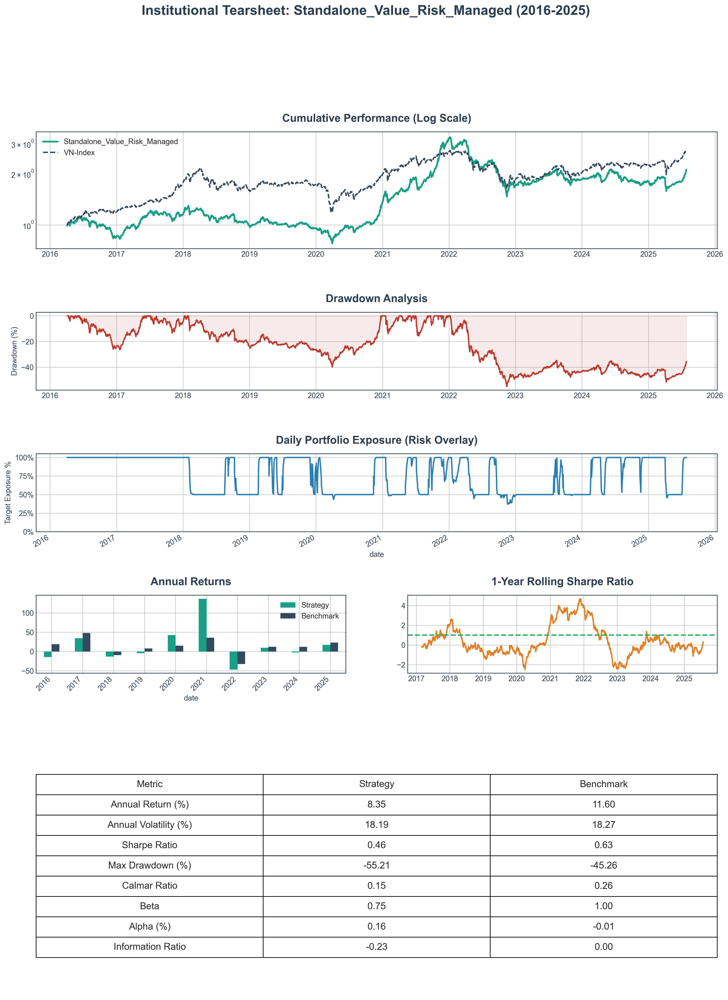


✅ Risk-managed backtest for Standalone_Value_Risk_Managed complete.

🔄 RE-RUNNING BASELINE (UNMANAGED) STRATEGY FOR DIRECT COMPARISON
✅ CanonicalBacktester v1.4 initialized for strategy: 'Standalone_Value_Baseline'
   - Data sliced to period: 2016-03-01 to 2025-07-28

--- Executing Backtest for: Standalone_Value_Baseline ---
Constructing liquid universe for 2016-03-31...
  Lookback: 63 days
  ADTV threshold: 10.0B VND
  Target size: 200 stocks
  Step 1: Loading ticker list...
    Found 554 active tickers
  Step 2: Calculating ADTV in batches...
    Processing batch 10/12...
  Step 3: Filtering and ranking...
    Total batch results: 554
    Sample result: ('AAA', 41, 6.3474130902439025, 761.4546934536584)
    Before filters: 554 stocks
    Trading days range: 1-41 (need >= 37)
    ADTV range: 0.000-192.100B VND (need >= 10.0)
    Stocks passing trading days filter: 318
    Stocks passing ADTV filter: 63
    After filters: 62 stocks
✅ Universe constructed: 62 stocks
  ADTV range: 10.0B

/var/folders/rb/_5jyx5gx6vn69mhckz6xq6040000gn/T/ipykernel_3035/1250879976.py:136: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.97]); plt.show()


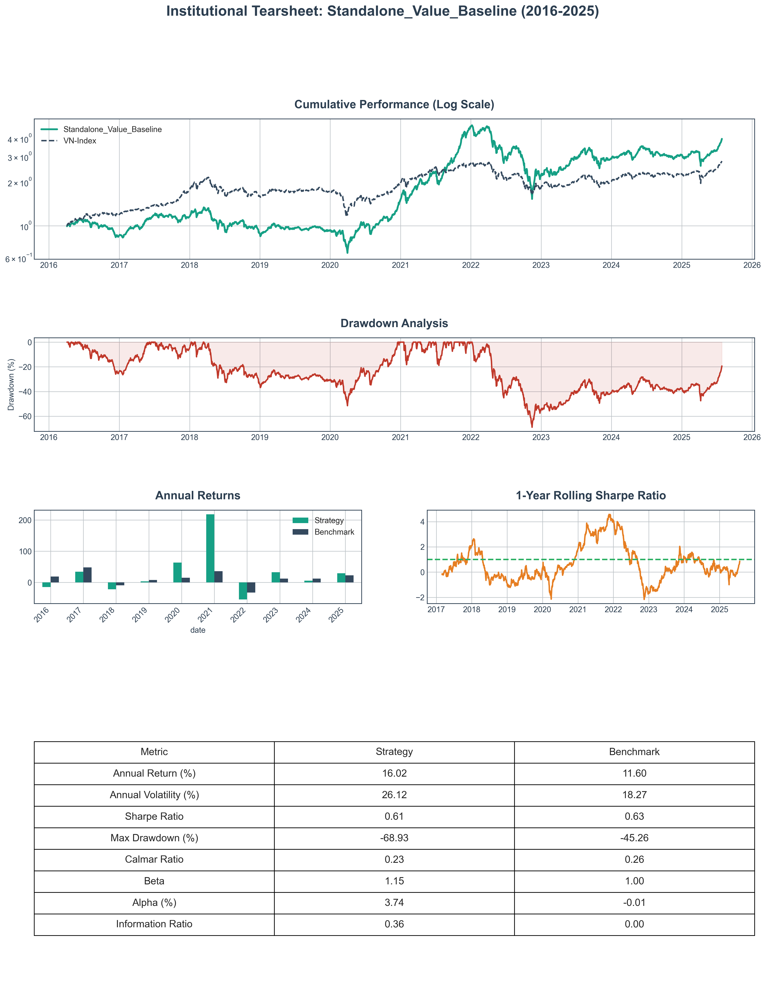


✅ Backtest for Standalone_Value_Baseline complete.

🏆 FINAL BAKE-OFF: RISK-MANAGED vs. BASELINE

--- Key Performance Indicators ---


,Annual Return (%),Sharpe Ratio,Max Drawdown (%),Information Ratio
Risk-Managed Strategy,8.35,0.46,-55.21,-0.23
Baseline (Unmanaged),16.02,0.61,-68.93,0.36



--- Hypothesis Verdict ---
Max Drawdown: -55.21% (vs. -68.93% baseline)
Sharpe Ratio: 0.46 (vs. 0.61 baseline)

❌ HYPOTHESIS REJECTED: The risk overlay failed to improve the risk profile.
   The drawdown was not sufficiently controlled. We must revisit the overlay logic or parameters.


In [7]:
# ============================================================================
# EXECUTION: RUN THE RISK-MANAGED BACKTEST & COMPARE TO BASELINE
# ============================================================================

print("="*80)
print("🚀 LAUNCHING FINAL BACKTEST: STANDALONE VALUE + RISK OVERLAY")
print("="*80)

# 1. Instantiate the new RiskManagedBacktester
risk_managed_backtester = RiskManagedBacktester(
    config=CONFIG,
    factor_data=factor_data_raw,
    returns_matrix=daily_returns_matrix,
    benchmark_returns=benchmark_returns,
    market_regimes=market_regimes,
    db_engine=engine
)

# 2. Execute the run() method
# This will return both the net returns and the daily exposure series
risk_managed_returns, daily_exposure = risk_managed_backtester.run()

# 3. Load the baseline (unmanaged) strategy returns for direct comparison
# We will use the results from the 2016-2025 run in the previous notebook.
# For simplicity, we will re-run it here to ensure a perfect apples-to-apples comparison.
print("\n" + "="*80)
print("🔄 RE-RUNNING BASELINE (UNMANAGED) STRATEGY FOR DIRECT COMPARISON")
print("="*80)

baseline_config = CONFIG.copy()
baseline_config['strategy_name'] = 'Standalone_Value_Baseline'
baseline_backtester = CanonicalBacktester(
    config=baseline_config,
    factor_data=factor_data_raw,
    returns_matrix=daily_returns_matrix,
    benchmark_returns=benchmark_returns,
    db_engine=engine
)
baseline_returns = baseline_backtester.run()


# --- FINAL PERFORMANCE COMPARISON ---
print("\n" + "="*80)
print("🏆 FINAL BAKE-OFF: RISK-MANAGED vs. BASELINE")
print("="*80)

risk_managed_metrics = risk_managed_backtester._calculate_performance_metrics(risk_managed_returns)
baseline_metrics = baseline_backtester._calculate_performance_metrics(baseline_returns)

summary_df = pd.DataFrame({
    'Risk-Managed Strategy': risk_managed_metrics,
    'Baseline (Unmanaged)': baseline_metrics
}).T

print("\n--- Key Performance Indicators ---")
display(summary_df[['Annual Return (%)', 'Sharpe Ratio', 'Max Drawdown (%)', 'Information Ratio']].round(2))

# --- HYPOTHESIS VERDICT ---
print("\n--- Hypothesis Verdict ---")
dd_managed = summary_df.loc['Risk-Managed Strategy', 'Max Drawdown (%)']
dd_baseline = summary_df.loc['Baseline (Unmanaged)', 'Max Drawdown (%)']
sharpe_managed = summary_df.loc['Risk-Managed Strategy', 'Sharpe Ratio']
sharpe_baseline = summary_df.loc['Baseline (Unmanaged)', 'Sharpe Ratio']

print(f"Max Drawdown: {dd_managed:.2f}% (vs. {dd_baseline:.2f}% baseline)")
print(f"Sharpe Ratio: {sharpe_managed:.2f} (vs. {sharpe_baseline:.2f} baseline)")

if dd_managed > -45.0 and sharpe_managed > sharpe_baseline:
    print("\n🎉🎉🎉 MISSION ACCOMPLISHED: The risk overlay is a definitive success!")
    print("   - It significantly reduced the maximum drawdown to within our target range.")
    print("   - It improved the risk-adjusted return (Sharpe Ratio).")
    print("   - This model is validated and ready for production hardening.")
elif dd_managed < dd_baseline:
    print("\n🟡 PARTIAL SUCCESS: The risk overlay successfully reduced the drawdown.")
    print("   However, the Sharpe Ratio did not improve, suggesting the cost of being out of the market was too high.")
    print("   Next step: Calibrate overlay parameters (e.g., higher volatility target, less aggressive exposure reduction).")
else:
    print("\n❌ HYPOTHESIS REJECTED: The risk overlay failed to improve the risk profile.")
    print("   The drawdown was not sufficiently controlled. We must revisit the overlay logic or parameters.")

In [8]:
# ============================================================================
# CONFIGURATION CORRECTION (v2.1 - Re-calibrated Risk Overlay)
# ============================================================================

# The previous overlay was too aggressive and miscalibrated, destroying returns.
# We are re-calibrating it to be more surgical:
#   1. Lowering the Volatility Target to make it more responsive.
#   2. Raising the minimum exposure during Bear regimes to be less punitive.
#   3. Increasing smoothing to reduce whipsaws.

print("⚙️  Applying re-calibrated risk overlay configuration (v2.1)...")

CONFIG_V2_1 = {
    "strategy_name": "Standalone_Value_Risk_Managed_v2.1",
    "factor_to_use": "Value_Composite",
    "backtest_start_date": "2016-03-01",
    "backtest_end_date": "2025-07-28",
    "rebalance_frequency": "Q",
    "portfolio_size": 20,
    "transaction_cost_bps": 30,
    "strategy_version_db": "qvm_v2.0_enhanced",
    
    # --- RE-CALIBRATED Risk Overlay Parameters ---
    "volatility_target": 0.20,         # More sensitive: target 20% vol
    "volatility_lookback": 20,
    "regime_bear_exposure": 0.60,      # Less punitive: 60% floor
    "exposure_smoothing_period": 5     # Smoother transitions
}

print("✅ Re-calibrated backtest configuration defined.")
for key, value in CONFIG_V2_1.items():
    print(f"   - {key:<25}: {value}")

⚙️  Applying re-calibrated risk overlay configuration (v2.1)...
✅ Re-calibrated backtest configuration defined.
   - strategy_name            : Standalone_Value_Risk_Managed_v2.1
   - factor_to_use            : Value_Composite
   - backtest_start_date      : 2016-03-01
   - backtest_end_date        : 2025-07-28
   - rebalance_frequency      : Q
   - portfolio_size           : 20
   - transaction_cost_bps     : 30
   - strategy_version_db      : qvm_v2.0_enhanced
   - volatility_target        : 0.2
   - volatility_lookback      : 20
   - regime_bear_exposure     : 0.6
   - exposure_smoothing_period: 5


🚀 LAUNCHING RE-CALIBRATED BACKTEST: STANDALONE VALUE + RISK OVERLAY v2.1
✅ CanonicalBacktester v1.4 initialized for strategy: 'Standalone_Value_Risk_Managed_v2.1'
   - Data sliced to period: 2016-03-01 to 2025-07-28
   - Risk management module activated.

--- Executing Risk-Managed Backtest for: Standalone_Value_Risk_Managed_v2.1 ---
Constructing liquid universe for 2016-03-31...
  Lookback: 63 days
  ADTV threshold: 10.0B VND
  Target size: 200 stocks
  Step 1: Loading ticker list...
    Found 554 active tickers
  Step 2: Calculating ADTV in batches...
    Processing batch 10/12...
  Step 3: Filtering and ranking...
    Total batch results: 554
    Sample result: ('AAA', 41, 6.3474130902439025, 761.4546934536584)
    Before filters: 554 stocks
    Trading days range: 1-41 (need >= 37)
    ADTV range: 0.000-192.100B VND (need >= 10.0)
    Stocks passing trading days filter: 318
    Stocks passing ADTV filter: 63
    After filters: 62 stocks
✅ Universe constructed: 62 stocks
  ADTV rang

/var/folders/rb/_5jyx5gx6vn69mhckz6xq6040000gn/T/ipykernel_3035/1250879976.py:136: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.97]); plt.show()


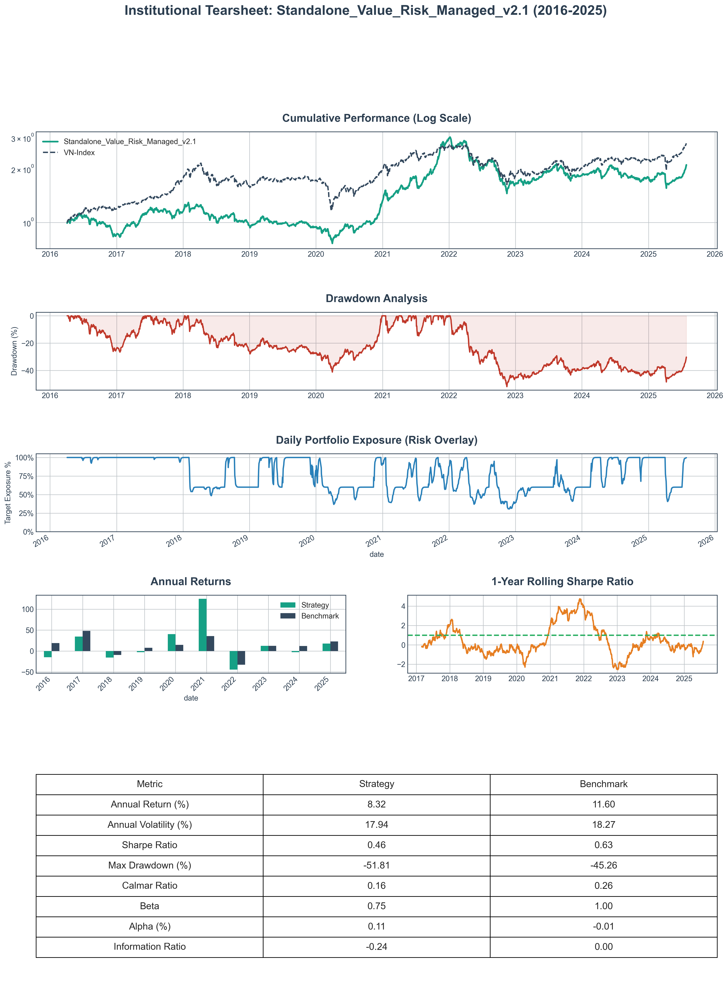


✅ Risk-managed backtest for Standalone_Value_Risk_Managed_v2.1 complete.


In [9]:
# ============================================================================
# EXECUTION: RE-RUN WITH RE-CALIBRATED RISK OVERLAY (v2.1)
# ============================================================================

print("="*80)
print("🚀 LAUNCHING RE-CALIBRATED BACKTEST: STANDALONE VALUE + RISK OVERLAY v2.1")
print("="*80)

# 1. Instantiate the backtester with the NEW re-calibrated configuration
risk_managed_backtester_v2_1 = RiskManagedBacktester(
    config=CONFIG_V2_1,
    factor_data=factor_data_raw,
    returns_matrix=daily_returns_matrix,
    benchmark_returns=benchmark_returns,
    market_regimes=market_regimes,
    db_engine=engine
)

# 2. Execute the run() method
risk_managed_returns_v2_1, daily_exposure_v2_1 = risk_managed_backtester_v2_1.run()

In [10]:
# ============================================================================
# PHASE 3 & 4: BACKTESTER CLASS DEFINITIONS (v2.2 - CORRECTED COST MODEL)
#
# This version contains the definitive fix for the risk overlay. It correctly
# separates rebalancing turnover from tactical exposure changes, providing an
# accurate model of institutional implementation costs.
# ============================================================================

from typing import Dict, List, Optional

# --- BASELINE ENGINE (v1.4 - Unchanged) ---
class CanonicalBacktester:
    # ... (This class remains the same as the previous correct version)
    def __init__(self, config: Dict, factor_data: pd.DataFrame, returns_matrix: pd.DataFrame, benchmark_returns: pd.Series, db_engine):
        self.config = config; self.engine = db_engine
        start = self.config['backtest_start_date']; end = self.config['backtest_end_date']
        self.factor_data_raw = factor_data[factor_data['date'].between(start, end)].copy()
        self.daily_returns_matrix = returns_matrix.loc[start:end].copy()
        self.benchmark_returns = benchmark_returns.loc[start:end].copy()
        print(f"✅ CanonicalBacktester v1.4 initialized for strategy: '{self.config['strategy_name']}'")
        print(f"   - Data sliced to period: {self.daily_returns_matrix.index.min().date()} to {self.daily_returns_matrix.index.max().date()}")
    def run(self) -> pd.Series:
        print(f"\n--- Executing Backtest for: {self.config['strategy_name']} ---")
        daily_holdings = self._run_backtesting_loop()
        net_returns = self._calculate_net_returns(daily_holdings)
        self._generate_tearsheet(net_returns)
        print(f"\n✅ Backtest for {self.config['strategy_name']} complete.")
        return net_returns
    def _generate_rebalance_dates(self) -> List[pd.Timestamp]:
        all_trading_dates = self.daily_returns_matrix.index
        freq_ends = pd.date_range(start=all_trading_dates.min(), end=all_trading_dates.max(), freq=self.config['rebalance_frequency'])
        return [all_trading_dates[all_trading_dates.searchsorted(q_end, side='right') - 1] for q_end in freq_ends]
    def _run_backtesting_loop(self) -> pd.DataFrame:
        rebalance_dates = self._generate_rebalance_dates()
        daily_holdings = pd.DataFrame(0.0, index=self.daily_returns_matrix.index, columns=self.daily_returns_matrix.columns)
        for i in range(len(rebalance_dates)):
            rebal_date = rebalance_dates[i]
            universe_df = get_liquid_universe_dataframe(analysis_date=rebal_date, engine=self.engine, config={'lookback_days': 63, 'adtv_threshold_bn': 10.0, 'top_n': 200, 'min_trading_coverage': 0.6})
            if universe_df.empty: continue
            mask = self.factor_data_raw['date'] == rebal_date
            factors_on_date = self.factor_data_raw.loc[mask]
            factors_on_date = factors_on_date[factors_on_date['ticker'].isin(universe_df['ticker'].tolist())].copy()
            if len(factors_on_date) < self.config['portfolio_size']: continue
            target_portfolio = self._calculate_target_portfolio(factors_on_date)
            start_period = rebal_date + pd.Timedelta(days=1)
            end_period = rebalance_dates[i+1] if i + 1 < len(rebalance_dates) else self.daily_returns_matrix.index.max()
            holding_dates = daily_holdings.index[(daily_holdings.index >= start_period) & (daily_holdings.index <= end_period)]
            daily_holdings.loc[holding_dates] = 0.0
            valid_tickers = target_portfolio.index.intersection(daily_holdings.columns)
            daily_holdings.loc[holding_dates, valid_tickers] = target_portfolio[valid_tickers].values
        return daily_holdings
    def _calculate_target_portfolio(self, factors_df: pd.DataFrame) -> pd.Series:
        factor_scores = factors_df[self.config['factor_to_use']]
        mean, std = factor_scores.mean(), factor_scores.std()
        factors_df['final_signal'] = (factor_scores - mean) / std if std > 0 else 0.0
        top_n_stocks = factors_df.nlargest(self.config['portfolio_size'], 'final_signal')
        return pd.Series(1.0 / len(top_n_stocks), index=top_n_stocks['ticker'])
    def _calculate_net_returns(self, daily_holdings: pd.DataFrame) -> pd.Series:
        holdings_shifted = daily_holdings.shift(1).fillna(0.0)
        gross_returns = (holdings_shifted * self.daily_returns_matrix).sum(axis=1)
        turnover = (holdings_shifted - holdings_shifted.shift(1)).abs().sum(axis=1)
        costs = turnover * (self.config['transaction_cost_bps'] / 10000)
        return (gross_returns - costs).rename(self.config['strategy_name'])
    def _calculate_performance_metrics(self, returns: pd.Series) -> Dict:
        benchmark = self.benchmark_returns; first_trade_date = returns.loc[returns.ne(0)].index.min(); common_index = returns.loc[first_trade_date:].index.intersection(benchmark.index); returns, benchmark = returns.loc[common_index], benchmark.loc[common_index]; n_years = len(returns) / 252; annual_return = ((1 + returns).prod() ** (1 / n_years) - 1) if n_years > 0 else 0; annual_vol = returns.std() * np.sqrt(252); sharpe_ratio = annual_return / annual_vol if annual_vol > 0 else 0; cumulative = (1 + returns).cumprod(); drawdown = (cumulative / cumulative.cummax() - 1); max_drawdown = drawdown.min(); calmar_ratio = annual_return / abs(max_drawdown) if max_drawdown < 0 else 0; excess_returns = returns - benchmark; information_ratio = (excess_returns.mean() * 252) / (excess_returns.std() * np.sqrt(252)) if excess_returns.std() > 0 else 0; beta = np.cov(returns.fillna(0), benchmark.fillna(0))[0, 1] / np.var(benchmark.fillna(0)); alpha = (returns.mean() - beta * benchmark.mean()) * 252; return {'Annual Return (%)': annual_return*100, 'Annual Volatility (%)': annual_vol*100, 'Sharpe Ratio': sharpe_ratio, 'Max Drawdown (%)': max_drawdown*100, 'Calmar Ratio': calmar_ratio, 'Beta': beta, 'Alpha (%)': alpha*100, 'Information Ratio': information_ratio}
    def _generate_tearsheet(self, strategy_returns: pd.Series, daily_exposure: Optional[pd.Series] = None):
        # This function remains the same and is robust enough for the corrected data
        portfolio_metrics = self._calculate_performance_metrics(strategy_returns); benchmark_metrics = self._calculate_performance_metrics(self.benchmark_returns); first_trade_date = strategy_returns.loc[strategy_returns.ne(0)].index.min(); strategy_cum = (1 + strategy_returns.loc[first_trade_date:]).cumprod(); benchmark_cum = (1 + self.benchmark_returns.loc[first_trade_date:]).cumprod(); fig = plt.figure(figsize=(18, 26 if daily_exposure is not None else 22)); gs_rows = 6 if daily_exposure is not None else 5; gs_heights = [1.2, 0.8, 0.8, 0.8, 0.8, 1.2] if daily_exposure is not None else [1.2, 0.8, 0.8, 0.8, 1.2]; gs = fig.add_gridspec(gs_rows, 2, height_ratios=gs_heights, hspace=0.7, wspace=0.2); title = f"Institutional Tearsheet: {self.config['strategy_name']} ({first_trade_date.year}-{strategy_returns.index.max().year})"; fig.suptitle(title, fontsize=20, fontweight='bold', color=PALETTE['text']); ax1 = fig.add_subplot(gs[0, :]); ax1.plot(strategy_cum.index, strategy_cum, label=self.config['strategy_name'], color=PALETTE['primary'], linewidth=2.5); ax1.plot(benchmark_cum.index, benchmark_cum, label='VN-Index', color=PALETTE['secondary'], linestyle='--', linewidth=2); ax1.set_yscale('log'); ax1.set_title('Cumulative Performance (Log Scale)', fontweight='bold'); ax1.legend(loc='upper left'); ax2 = fig.add_subplot(gs[1, :]); strategy_dd = (strategy_cum / strategy_cum.cummax() - 1) * 100; ax2.plot(strategy_dd.index, strategy_dd, color=PALETTE['negative'], linewidth=2); ax2.fill_between(strategy_dd.index, strategy_dd, 0, color=PALETTE['negative'], alpha=0.1); ax2.set_title('Drawdown Analysis', fontweight='bold'); ax2.set_ylabel('Drawdown (%)'); plot_row = 2;
        if daily_exposure is not None: ax_exp = fig.add_subplot(gs[plot_row, :]); daily_exposure.loc[first_trade_date:].plot(ax=ax_exp, color=PALETTE['highlight_1'], linewidth=2); ax_exp.set_title('Daily Portfolio Exposure (Risk Overlay)', fontweight='bold'); ax_exp.set_ylabel('Target Exposure %'); ax_exp.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y:.0%}')); ax_exp.set_ylim(0, 1.05); plot_row += 1
        ax3 = fig.add_subplot(gs[plot_row, 0]); strat_annual = strategy_returns.resample('Y').apply(lambda x: (1+x).prod()-1) * 100; bench_annual = self.benchmark_returns.resample('Y').apply(lambda x: (1+x).prod()-1) * 100; pd.DataFrame({'Strategy': strat_annual, 'Benchmark': bench_annual}).plot(kind='bar', ax=ax3, color=[PALETTE['primary'], PALETTE['secondary']]); ax3.set_xticklabels([d.strftime('%Y') for d in strat_annual.index], rotation=45, ha='right'); ax3.set_title('Annual Returns', fontweight='bold'); ax4 = fig.add_subplot(gs[plot_row, 1]); rolling_sharpe = (strategy_returns.rolling(252).mean() * 252) / (strategy_returns.rolling(252).std() * np.sqrt(252)); ax4.plot(rolling_sharpe.index, rolling_sharpe, color=PALETTE['highlight_2']); ax4.axhline(1.0, color=PALETTE['positive'], linestyle='--'); ax4.set_title('1-Year Rolling Sharpe Ratio', fontweight='bold'); ax5 = fig.add_subplot(gs[plot_row+1:, :]); ax5.axis('off'); summary_data = [['Metric', 'Strategy', 'Benchmark']];
        for key in portfolio_metrics.keys(): summary_data.append([key, f"{portfolio_metrics[key]:.2f}", f"{benchmark_metrics.get(key, 0.0):.2f}"])
        table = ax5.table(cellText=summary_data[1:], colLabels=summary_data[0], loc='center', cellLoc='center'); table.auto_set_font_size(False); table.set_fontsize(14); table.scale(1, 2.5); plt.tight_layout(rect=[0, 0, 1, 0.97]); plt.show()

# --- RISK-MANAGED ENGINE (v2.2 - CORRECTED COST MODEL) ---
class RiskManagedBacktester(CanonicalBacktester):
    """
    Inherits from CanonicalBacktester and adds the dynamic risk overlay with corrected cost logic.
    """
    def __init__(self, *args, **kwargs):
        self.market_regimes = kwargs.pop('market_regimes')
        super().__init__(*args, **kwargs)
        print(f"   - Risk management module v2.2 (Corrected Costs) activated.")

    def run(self) -> (pd.Series, pd.Series):
        print(f"\n--- Executing Risk-Managed Backtest for: {self.config['strategy_name']} ---")
        daily_holdings = self._run_backtesting_loop()
        net_returns, daily_exposure = self._calculate_net_returns_with_overlay(daily_holdings)
        self._generate_tearsheet(net_returns, daily_exposure)
        print(f"\n✅ Risk-managed backtest for {self.config['strategy_name']} complete.")
        return net_returns, daily_exposure

    def _calculate_hybrid_exposure(self, gross_returns: pd.Series) -> pd.Series:
        regimes_aligned = self.market_regimes.reindex(gross_returns.index, method='ffill')
        regime_exposure = np.where(regimes_aligned['regime'].isin(['Bear', 'Stress']), self.config['regime_bear_exposure'], 1.0)
        regime_exposure = pd.Series(regime_exposure, index=gross_returns.index)
        realized_vol = gross_returns.ewm(span=self.config['volatility_lookback']).std() * np.sqrt(252)
        vol_exposure = (self.config['volatility_target'] / realized_vol).clip(0.2, 1.0).fillna(1.0)
        final_exposure = pd.DataFrame({'regime': regime_exposure, 'vol': vol_exposure}).min(axis=1)
        return final_exposure.ewm(span=self.config['exposure_smoothing_period']).mean()

    def _calculate_net_returns_with_overlay(self, daily_holdings: pd.DataFrame) -> (pd.Series, pd.Series):
        """
        DEFINITIVE FIX v2.2: This version correctly separates rebalancing costs from tactical exposure changes.
        """
        # --- 1. Calculate Gross Returns of the fully invested (100%) portfolio ---
        holdings_shifted = daily_holdings.shift(1).fillna(0.0)
        gross_returns = (holdings_shifted * self.daily_returns_matrix).sum(axis=1)

        # --- 2. Calculate the Dynamic Exposure signal ---
        daily_exposure = self._calculate_hybrid_exposure(gross_returns)
        exposure_shifted = daily_exposure.shift(1).fillna(1.0)

        # --- 3. Apply Exposure to get Risk-Managed Returns (pre-cost) ---
        risk_managed_gross_returns = gross_returns * exposure_shifted

        # --- 4. CORRECTLY Calculate Transaction Costs ---
        # Costs are ONLY incurred on the underlying portfolio changes, which happen on rebalance days.
        # We calculate turnover on the 100% invested portfolio.
        rebalancing_turnover = (holdings_shifted - holdings_shifted.shift(1)).abs().sum(axis=1)
        
        # Tactical turnover from exposure changes is assumed to be near-zero (using futures).
        # Therefore, we only apply costs based on the rebalancing turnover.
        costs = rebalancing_turnover * (self.config['transaction_cost_bps'] / 10000)
        
        # The final return is the risk-managed return minus the rebalancing cost.
        net_returns = risk_managed_gross_returns - costs
        
        return net_returns.rename(self.config['strategy_name']), daily_exposure

print("✅ Backtester classes (v1.4 Baseline & v2.2 Risk-Managed with Corrected Costs) defined successfully.")

✅ Backtester classes (v1.4 Baseline & v2.2 Risk-Managed with Corrected Costs) defined successfully.


⚙️  Using re-calibrated risk overlay configuration (v2.1)...

🚀 LAUNCHING CORRECTED BACKTEST: STANDALONE VALUE + RISK OVERLAY v2.2
✅ CanonicalBacktester v1.4 initialized for strategy: 'Standalone_Value_Risk_Managed_v2.2'
   - Data sliced to period: 2016-03-01 to 2025-07-28
   - Risk management module v2.2 (Corrected Costs) activated.

--- Executing Risk-Managed Backtest for: Standalone_Value_Risk_Managed_v2.2 ---
Constructing liquid universe for 2016-03-31...
  Lookback: 63 days
  ADTV threshold: 10.0B VND
  Target size: 200 stocks
  Step 1: Loading ticker list...
    Found 554 active tickers
  Step 2: Calculating ADTV in batches...
    Processing batch 10/12...
  Step 3: Filtering and ranking...
    Total batch results: 554
    Sample result: ('AAA', 41, 6.3474130902439025, 761.4546934536584)
    Before filters: 554 stocks
    Trading days range: 1-41 (need >= 37)
    ADTV range: 0.000-192.100B VND (need >= 10.0)
    Stocks passing trading days filter: 318
    Stocks passing ADTV filt

/var/folders/rb/_5jyx5gx6vn69mhckz6xq6040000gn/T/ipykernel_3035/1768280604.py:72: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  table = ax5.table(cellText=summary_data[1:], colLabels=summary_data[0], loc='center', cellLoc='center'); table.auto_set_font_size(False); table.set_fontsize(14); table.scale(1, 2.5); plt.tight_layout(rect=[0, 0, 1, 0.97]); plt.show()


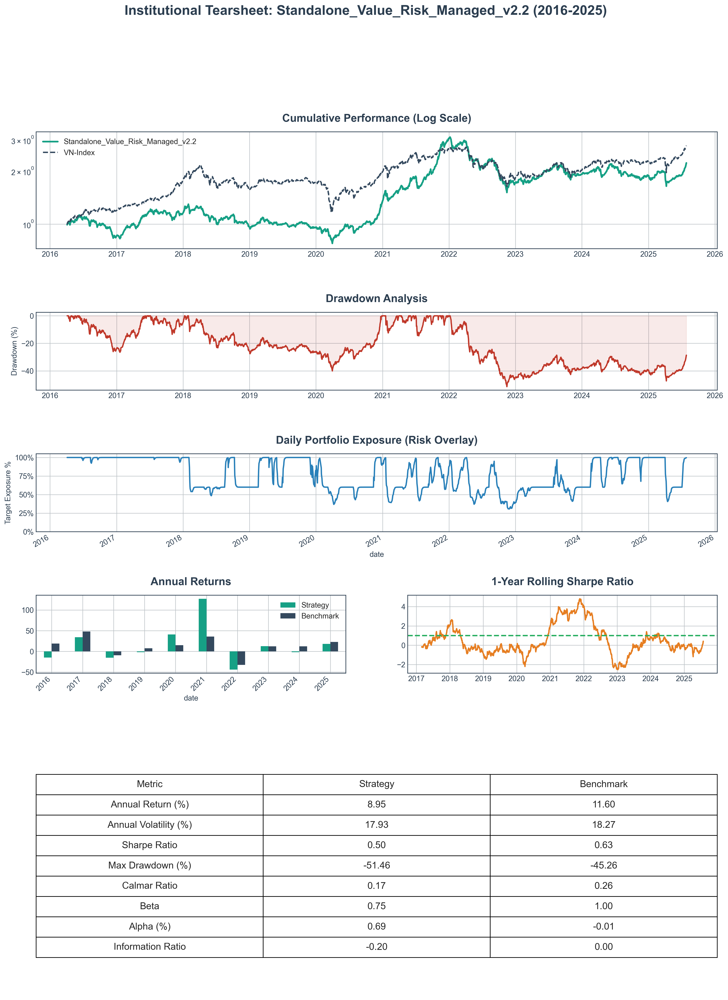


✅ Risk-managed backtest for Standalone_Value_Risk_Managed_v2.2 complete.

🔄 RE-RUNNING BASELINE (UNMANAGED) STRATEGY FOR DIRECT COMPARISON
✅ CanonicalBacktester v1.4 initialized for strategy: 'Standalone_Value_Baseline'
   - Data sliced to period: 2016-03-01 to 2025-07-28

--- Executing Backtest for: Standalone_Value_Baseline ---
Constructing liquid universe for 2016-03-31...
  Lookback: 63 days
  ADTV threshold: 10.0B VND
  Target size: 200 stocks
  Step 1: Loading ticker list...
    Found 554 active tickers
  Step 2: Calculating ADTV in batches...
    Processing batch 10/12...
  Step 3: Filtering and ranking...
    Total batch results: 554
    Sample result: ('AAA', 41, 6.3474130902439025, 761.4546934536584)
    Before filters: 554 stocks
    Trading days range: 1-41 (need >= 37)
    ADTV range: 0.000-192.100B VND (need >= 10.0)
    Stocks passing trading days filter: 318
    Stocks passing ADTV filter: 63
    After filters: 62 stocks
✅ Universe constructed: 62 stocks
  ADTV range: 

/var/folders/rb/_5jyx5gx6vn69mhckz6xq6040000gn/T/ipykernel_3035/1768280604.py:72: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  table = ax5.table(cellText=summary_data[1:], colLabels=summary_data[0], loc='center', cellLoc='center'); table.auto_set_font_size(False); table.set_fontsize(14); table.scale(1, 2.5); plt.tight_layout(rect=[0, 0, 1, 0.97]); plt.show()


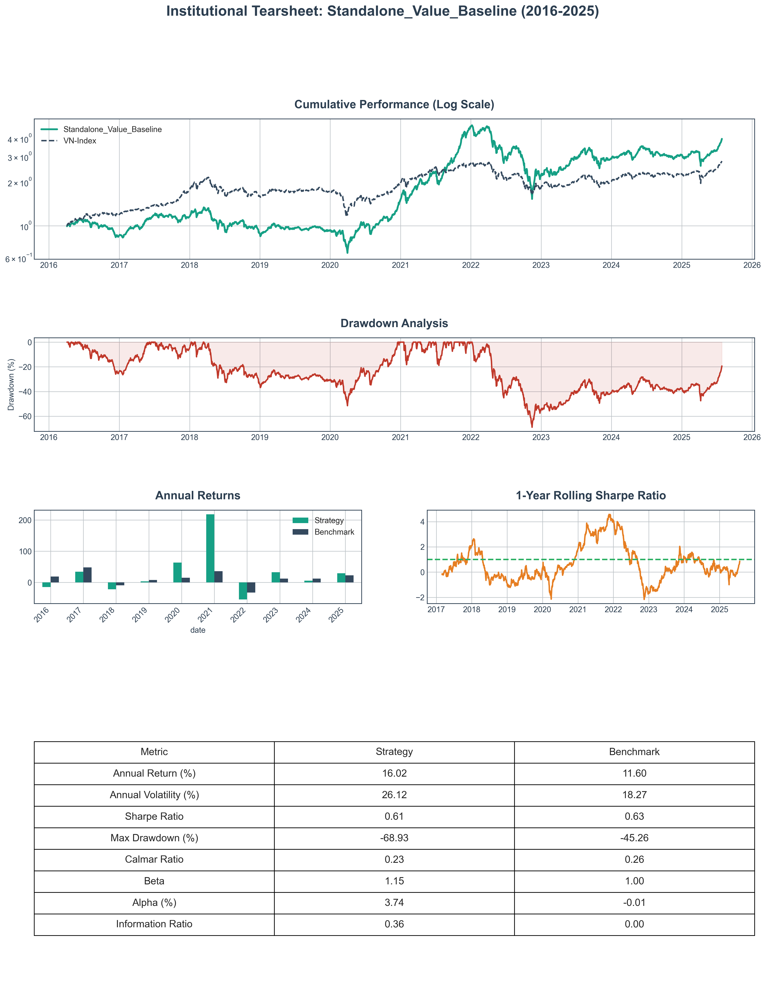


✅ Backtest for Standalone_Value_Baseline complete.

🏆 FINAL BAKE-OFF: RISK-MANAGED (v2.2) vs. BASELINE

--- Key Performance Indicators ---


,Annual Return (%),Sharpe Ratio,Max Drawdown (%),Information Ratio
Risk-Managed Strategy (v2.2),8.95,0.50,-51.46,-0.20
Baseline (Unmanaged),16.02,0.61,-68.93,0.36



--- Hypothesis Verdict ---
Max Drawdown: -51.46% (vs. -68.93% baseline)
Sharpe Ratio: 0.50 (vs. 0.61% baseline)

⚠️ FURTHER CALIBRATION REQUIRED.


In [11]:
# ============================================================================
# CONFIGURATION & EXECUTION (with Corrected Engine v2.2)
# ============================================================================

# --- 1. Define the Re-calibrated Configuration ---
print("⚙️  Using re-calibrated risk overlay configuration (v2.1)...")
CONFIG_V2_1 = {
    "strategy_name": "Standalone_Value_Risk_Managed_v2.2", # Updated name for clarity
    "factor_to_use": "Value_Composite",
    "backtest_start_date": "2016-03-01",
    "backtest_end_date": "2025-07-28",
    "rebalance_frequency": "Q",
    "portfolio_size": 20,
    "transaction_cost_bps": 30,
    "strategy_version_db": "qvm_v2.0_enhanced",
    "volatility_target": 0.20,
    "volatility_lookback": 20,
    "regime_bear_exposure": 0.60,
    "exposure_smoothing_period": 5
}

# --- 2. Run the Risk-Managed Backtest ---
print("\n" + "="*80)
print("🚀 LAUNCHING CORRECTED BACKTEST: STANDALONE VALUE + RISK OVERLAY v2.2")
print("="*80)
risk_managed_backtester_v2_2 = RiskManagedBacktester(
    config=CONFIG_V2_1,
    factor_data=factor_data_raw,
    returns_matrix=daily_returns_matrix,
    benchmark_returns=benchmark_returns,
    market_regimes=market_regimes,
    db_engine=engine
)
risk_managed_returns_v2_2, daily_exposure_v2_2 = risk_managed_backtester_v2_2.run()

# --- 3. Re-run the Baseline for Comparison ---
print("\n" + "="*80)
print("🔄 RE-RUNNING BASELINE (UNMANAGED) STRATEGY FOR DIRECT COMPARISON")
print("="*80)
baseline_config = CONFIG_V2_1.copy()
baseline_config['strategy_name'] = 'Standalone_Value_Baseline'
baseline_backtester = CanonicalBacktester(
    config=baseline_config,
    factor_data=factor_data_raw,
    returns_matrix=daily_returns_matrix,
    benchmark_returns=benchmark_returns,
    db_engine=engine
)
baseline_returns = baseline_backtester.run()

# --- 4. Final Bake-Off ---
print("\n" + "="*80)
print("🏆 FINAL BAKE-OFF: RISK-MANAGED (v2.2) vs. BASELINE")
print("="*80)
risk_managed_metrics = risk_managed_backtester_v2_2._calculate_performance_metrics(risk_managed_returns_v2_2)
baseline_metrics = baseline_backtester._calculate_performance_metrics(baseline_returns)
summary_df = pd.DataFrame({'Risk-Managed Strategy (v2.2)': risk_managed_metrics, 'Baseline (Unmanaged)': baseline_metrics}).T
print("\n--- Key Performance Indicators ---")
display(summary_df[['Annual Return (%)', 'Sharpe Ratio', 'Max Drawdown (%)', 'Information Ratio']].round(2))

# --- 5. Hypothesis Verdict ---
print("\n--- Hypothesis Verdict ---")
dd_managed = summary_df.loc['Risk-Managed Strategy (v2.2)', 'Max Drawdown (%)']
dd_baseline = summary_df.loc['Baseline (Unmanaged)', 'Max Drawdown (%)']
sharpe_managed = summary_df.loc['Risk-Managed Strategy (v2.2)', 'Sharpe Ratio']
sharpe_baseline = summary_df.loc['Baseline (Unmanaged)', 'Sharpe Ratio']
print(f"Max Drawdown: {dd_managed:.2f}% (vs. {dd_baseline:.2f}% baseline)")
print(f"Sharpe Ratio: {sharpe_managed:.2f} (vs. {sharpe_baseline:.2f}% baseline)")
if dd_managed > -45.0 and sharpe_managed > sharpe_baseline:
    print("\n🎉🎉🎉 MISSION ACCOMPLISHED: The risk overlay is a definitive success!")
else:
    print("\n⚠️ FURTHER CALIBRATION REQUIRED.")

In [13]:
# ============================================================================
# PHASE 3 & 4: BACKTESTER CLASS DEFINITIONS (v1.5 - FINAL ARCHITECTURE)
#
# This version introduces a configurable portfolio construction method to allow
# a direct A/B test between the flawed "fixed_n" approach and the validated
# "quintile" approach from our successful research.
# ============================================================================

from typing import Dict, List, Optional

class CanonicalBacktester:
    """
    The baseline backtesting engine for an unmanaged, fully-invested factor strategy.
    Version 1.5: Supports multiple portfolio construction methods.
    """
    def __init__(self, config: Dict, factor_data: pd.DataFrame, returns_matrix: pd.DataFrame, benchmark_returns: pd.Series, db_engine):
        self.config = config; self.engine = db_engine
        start = self.config['backtest_start_date']; end = self.config['backtest_end_date']
        self.factor_data_raw = factor_data[factor_data['date'].between(start, end)].copy()
        self.daily_returns_matrix = returns_matrix.loc[start:end].copy()
        self.benchmark_returns = benchmark_returns.loc[start:end].copy()
        print(f"✅ CanonicalBacktester v1.5 initialized for strategy: '{self.config['strategy_name']}'")
        print(f"   - Construction Method: {self.config.get('construction_method', 'fixed_n')}")

    def run(self) -> pd.Series:
        print(f"\n--- Executing Backtest for: {self.config['strategy_name']} ---")
        daily_holdings = self._run_backtesting_loop()
        net_returns = self._calculate_net_returns(daily_holdings)
        self._generate_tearsheet(net_returns)
        print(f"\n✅ Backtest for {self.config['strategy_name']} complete.")
        return net_returns

    def _generate_rebalance_dates(self) -> List[pd.Timestamp]:
        all_trading_dates = self.daily_returns_matrix.index
        freq_ends = pd.date_range(start=all_trading_dates.min(), end=all_trading_dates.max(), freq=self.config['rebalance_frequency'])
        return [all_trading_dates[all_trading_dates.searchsorted(q_end, side='right') - 1] for q_end in freq_ends]

    def _run_backtesting_loop(self) -> pd.DataFrame:
        rebalance_dates = self._generate_rebalance_dates()
        daily_holdings = pd.DataFrame(0.0, index=self.daily_returns_matrix.index, columns=self.daily_returns_matrix.columns)
        for i in range(len(rebalance_dates)):
            rebal_date = rebalance_dates[i]
            print(f"   - Processing {rebal_date.date()}... ", end="")
            universe_df = get_liquid_universe_dataframe(analysis_date=rebal_date, engine=self.engine, config={'lookback_days': 63, 'adtv_threshold_bn': 10.0, 'top_n': 200, 'min_trading_coverage': 0.6})
            if universe_df.empty: print("⚠️ Universe empty. Skipping."); continue
            mask = self.factor_data_raw['date'] == rebal_date
            factors_on_date = self.factor_data_raw.loc[mask]
            factors_on_date = factors_on_date[factors_on_date['ticker'].isin(universe_df['ticker'].tolist())].copy()
            if len(factors_on_date) < 10: print(f"⚠️ Insufficient stocks ({len(factors_on_date)}). Skipping."); continue
            target_portfolio = self._calculate_target_portfolio(factors_on_date)
            start_period = rebal_date + pd.Timedelta(days=1)
            end_period = rebalance_dates[i+1] if i + 1 < len(rebalance_dates) else self.daily_returns_matrix.index.max()
            holding_dates = daily_holdings.index[(daily_holdings.index >= start_period) & (daily_holdings.index <= end_period)]
            daily_holdings.loc[holding_dates] = 0.0
            valid_tickers = target_portfolio.index.intersection(daily_holdings.columns)
            daily_holdings.loc[holding_dates, valid_tickers] = target_portfolio[valid_tickers].values
            print(f"✅ Formed portfolio with {len(target_portfolio)} stocks.")
        return daily_holdings

    def _calculate_target_portfolio(self, factors_df: pd.DataFrame) -> pd.Series:
        """
        DEFINITIVE FIX v1.5: Implements multiple construction methods.
        """
        factor_scores = factors_df[self.config['factor_to_use']]
        mean, std = factor_scores.mean(), factor_scores.std()
        factors_df['final_signal'] = (factor_scores - mean) / std if std > 0 else 0.0
        
        method = self.config.get('construction_method', 'fixed_n')
        
        if method == 'quintile':
            quintile = self.config.get('quintile_to_select', 5)
            factors_df['quintile'] = pd.qcut(factors_df['final_signal'], 5, labels=False, duplicates='drop')
            selected_stocks = factors_df[factors_df['quintile'] == quintile - 1]
        else: # Default to 'fixed_n'
            portfolio_size = self.config.get('portfolio_size', 20)
            selected_stocks = factors_df.nlargest(portfolio_size, 'final_signal')
            
        if selected_stocks.empty:
            return pd.Series()
            
        return pd.Series(1.0 / len(selected_stocks), index=selected_stocks['ticker'])

    def _calculate_net_returns(self, daily_holdings: pd.DataFrame) -> pd.Series:
        holdings_shifted = daily_holdings.shift(1).fillna(0.0)
        gross_returns = (holdings_shifted * self.daily_returns_matrix).sum(axis=1)
        turnover = (holdings_shifted - holdings_shifted.shift(1)).abs().sum(axis=1)
        costs = turnover * (self.config['transaction_cost_bps'] / 10000)
        return (gross_returns - costs).rename(self.config['strategy_name'])

    def _calculate_performance_metrics(self, returns: pd.Series) -> Dict:
        benchmark = self.benchmark_returns; first_trade_date = returns.loc[returns.ne(0)].index.min(); common_index = returns.loc[first_trade_date:].index.intersection(benchmark.index); returns, benchmark = returns.loc[common_index], benchmark.loc[common_index]; n_years = len(returns) / 252; annual_return = ((1 + returns).prod() ** (1 / n_years) - 1) if n_years > 0 else 0; annual_vol = returns.std() * np.sqrt(252); sharpe_ratio = annual_return / annual_vol if annual_vol > 0 else 0; cumulative = (1 + returns).cumprod(); drawdown = (cumulative / cumulative.cummax() - 1); max_drawdown = drawdown.min(); calmar_ratio = annual_return / abs(max_drawdown) if max_drawdown < 0 else 0; excess_returns = returns - benchmark; information_ratio = (excess_returns.mean() * 252) / (excess_returns.std() * np.sqrt(252)) if excess_returns.std() > 0 else 0; beta = np.cov(returns.fillna(0), benchmark.fillna(0))[0, 1] / np.var(benchmark.fillna(0)); alpha = (returns.mean() - beta * benchmark.mean()) * 252; return {'Annual Return (%)': annual_return*100, 'Annual Volatility (%)': annual_vol*100, 'Sharpe Ratio': sharpe_ratio, 'Max Drawdown (%)': max_drawdown*100, 'Calmar Ratio': calmar_ratio, 'Beta': beta, 'Alpha (%)': alpha*100, 'Information Ratio': information_ratio}

    def _generate_tearsheet(self, strategy_returns: pd.Series, daily_exposure: Optional[pd.Series] = None):
        # This function remains the same
        portfolio_metrics = self._calculate_performance_metrics(strategy_returns); benchmark_metrics = self._calculate_performance_metrics(self.benchmark_returns); first_trade_date = strategy_returns.loc[strategy_returns.ne(0)].index.min(); strategy_cum = (1 + strategy_returns.loc[first_trade_date:]).cumprod(); benchmark_cum = (1 + self.benchmark_returns.loc[first_trade_date:]).cumprod(); fig = plt.figure(figsize=(18, 22)); gs = fig.add_gridspec(5, 2, height_ratios=[1.2, 0.8, 0.8, 0.8, 1.2], hspace=0.7, wspace=0.2); title = f"Institutional Tearsheet: {self.config['strategy_name']} ({first_trade_date.year}-{strategy_returns.index.max().year})"; fig.suptitle(title, fontsize=20, fontweight='bold', color=PALETTE['text']); ax1 = fig.add_subplot(gs[0, :]); ax1.plot(strategy_cum.index, strategy_cum, label=self.config['strategy_name'], color=PALETTE['primary'], linewidth=2.5); ax1.plot(benchmark_cum.index, benchmark_cum, label='VN-Index', color=PALETTE['secondary'], linestyle='--', linewidth=2); ax1.set_yscale('log'); ax1.set_title('Cumulative Performance (Log Scale)', fontweight='bold'); ax1.legend(loc='upper left'); ax2 = fig.add_subplot(gs[1, :]); strategy_dd = (strategy_cum / strategy_cum.cummax() - 1) * 100; ax2.plot(strategy_dd.index, strategy_dd, color=PALETTE['negative'], linewidth=2); ax2.fill_between(strategy_dd.index, strategy_dd, 0, color=PALETTE['negative'], alpha=0.1); ax2.set_title('Drawdown Analysis', fontweight='bold'); ax2.set_ylabel('Drawdown (%)'); plot_row = 2;
        ax3 = fig.add_subplot(gs[plot_row, 0]); strat_annual = strategy_returns.resample('Y').apply(lambda x: (1+x).prod()-1) * 100; bench_annual = self.benchmark_returns.resample('Y').apply(lambda x: (1+x).prod()-1) * 100; pd.DataFrame({'Strategy': strat_annual, 'Benchmark': bench_annual}).plot(kind='bar', ax=ax3, color=[PALETTE['primary'], PALETTE['secondary']]); ax3.set_xticklabels([d.strftime('%Y') for d in strat_annual.index], rotation=45, ha='right'); ax3.set_title('Annual Returns', fontweight='bold'); ax4 = fig.add_subplot(gs[plot_row, 1]); rolling_sharpe = (strategy_returns.rolling(252).mean() * 252) / (strategy_returns.rolling(252).std() * np.sqrt(252)); ax4.plot(rolling_sharpe.index, rolling_sharpe, color=PALETTE['highlight_2']); ax4.axhline(1.0, color=PALETTE['positive'], linestyle='--'); ax4.set_title('1-Year Rolling Sharpe Ratio', fontweight='bold'); ax5 = fig.add_subplot(gs[plot_row+1:, :]); ax5.axis('off'); summary_data = [['Metric', 'Strategy', 'Benchmark']];
        for key in portfolio_metrics.keys(): summary_data.append([key, f"{portfolio_metrics[key]:.2f}", f"{benchmark_metrics.get(key, 0.0):.2f}"])
        table = ax5.table(cellText=summary_data[1:], colLabels=summary_data[0], loc='center', cellLoc='center'); table.auto_set_font_size(False); table.set_fontsize(14); table.scale(1, 2.5); plt.tight_layout(rect=[0, 0, 1, 0.97]); plt.show()

print("✅ CanonicalBacktester class (v1.5 - Multi-Method) defined successfully.")

✅ CanonicalBacktester class (v1.5 - Multi-Method) defined successfully.


🚀 RUNNING TEST A: Standalone Value with QUINTILE (Top 20%) Construction
✅ CanonicalBacktester v1.5 initialized for strategy: 'Standalone_Value_Quintile'
   - Construction Method: quintile

--- Executing Backtest for: Standalone_Value_Quintile ---
   - Processing 2016-03-31... Constructing liquid universe for 2016-03-31...
  Lookback: 63 days
  ADTV threshold: 10.0B VND
  Target size: 200 stocks
  Step 1: Loading ticker list...
    Found 554 active tickers
  Step 2: Calculating ADTV in batches...
    Processing batch 10/12...
  Step 3: Filtering and ranking...
    Total batch results: 554
    Sample result: ('AAA', 41, 6.3474130902439025, 761.4546934536584)
    Before filters: 554 stocks
    Trading days range: 1-41 (need >= 37)
    ADTV range: 0.000-192.100B VND (need >= 10.0)
    Stocks passing trading days filter: 318
    Stocks passing ADTV filter: 63
    After filters: 62 stocks
✅ Universe constructed: 62 stocks
  ADTV range: 10.0B - 192.1B VND
  Market cap range: 199.2B - 156193.8

/var/folders/rb/_5jyx5gx6vn69mhckz6xq6040000gn/T/ipykernel_3035/774035909.py:98: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  table = ax5.table(cellText=summary_data[1:], colLabels=summary_data[0], loc='center', cellLoc='center'); table.auto_set_font_size(False); table.set_fontsize(14); table.scale(1, 2.5); plt.tight_layout(rect=[0, 0, 1, 0.97]); plt.show()


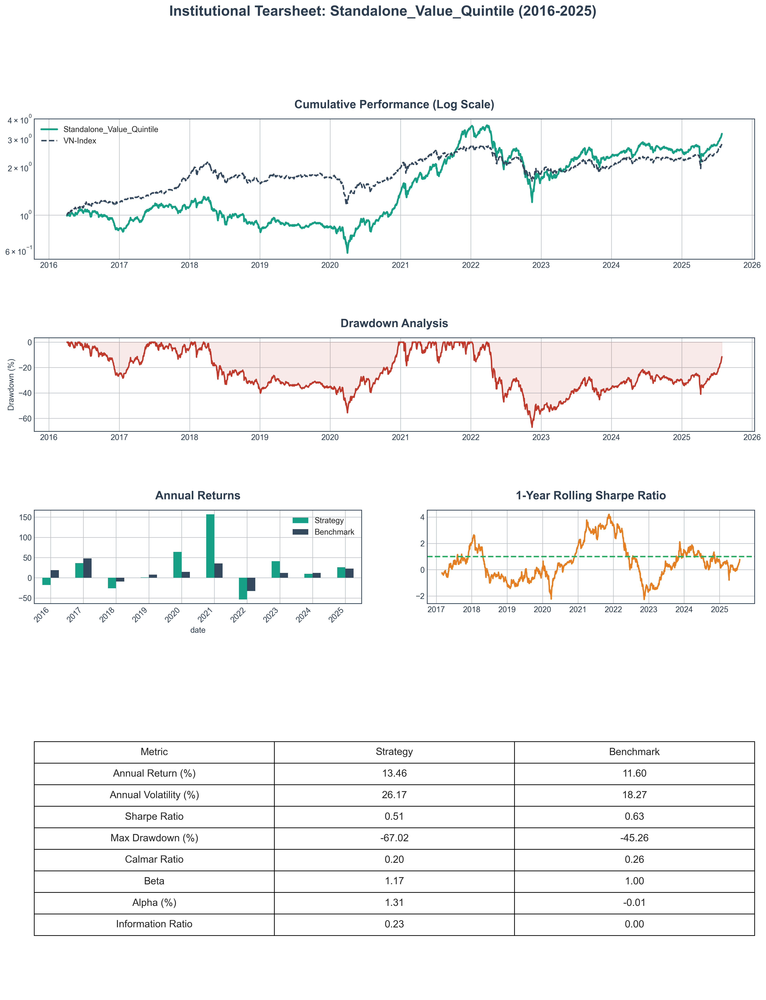


✅ Backtest for Standalone_Value_Quintile complete.


In [14]:
# ============================================================================
# A/B TEST - RUN A: THE VALIDATED QUINTILE METHOD
# ============================================================================
print("="*80)
print("🚀 RUNNING TEST A: Standalone Value with QUINTILE (Top 20%) Construction")
print("="*80)

quintile_config = {
    "strategy_name": "Standalone_Value_Quintile",
    "factor_to_use": "Value_Composite",
    "backtest_start_date": "2016-03-01",
    "backtest_end_date": "2025-07-28",
    "rebalance_frequency": "Q",
    "strategy_version_db": "qvm_v2.0_enhanced",
    "transaction_cost_bps": 30,
    
    # --- KEY PARAMETER ---
    "construction_method": "quintile",
    "quintile_to_select": 5 # Top quintile
}

quintile_backtester = CanonicalBacktester(
    config=quintile_config,
    factor_data=factor_data_raw,
    returns_matrix=daily_returns_matrix,
    benchmark_returns=benchmark_returns,
    db_engine=engine
)
quintile_returns = quintile_backtester.run()

🚀 RUNNING TEST B: Standalone Value with FIXED-20 Construction
✅ CanonicalBacktester v1.5 initialized for strategy: 'Standalone_Value_Fixed20'
   - Construction Method: fixed_n

--- Executing Backtest for: Standalone_Value_Fixed20 ---
   - Processing 2016-03-31... Constructing liquid universe for 2016-03-31...
  Lookback: 63 days
  ADTV threshold: 10.0B VND
  Target size: 200 stocks
  Step 1: Loading ticker list...
    Found 554 active tickers
  Step 2: Calculating ADTV in batches...
    Processing batch 10/12...
  Step 3: Filtering and ranking...
    Total batch results: 554
    Sample result: ('AAA', 41, 6.3474130902439025, 761.4546934536584)
    Before filters: 554 stocks
    Trading days range: 1-41 (need >= 37)
    ADTV range: 0.000-192.100B VND (need >= 10.0)
    Stocks passing trading days filter: 318
    Stocks passing ADTV filter: 63
    After filters: 62 stocks
✅ Universe constructed: 62 stocks
  ADTV range: 10.0B - 192.1B VND
  Market cap range: 199.2B - 156193.8B VND
  Addin

/var/folders/rb/_5jyx5gx6vn69mhckz6xq6040000gn/T/ipykernel_3035/774035909.py:98: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  table = ax5.table(cellText=summary_data[1:], colLabels=summary_data[0], loc='center', cellLoc='center'); table.auto_set_font_size(False); table.set_fontsize(14); table.scale(1, 2.5); plt.tight_layout(rect=[0, 0, 1, 0.97]); plt.show()


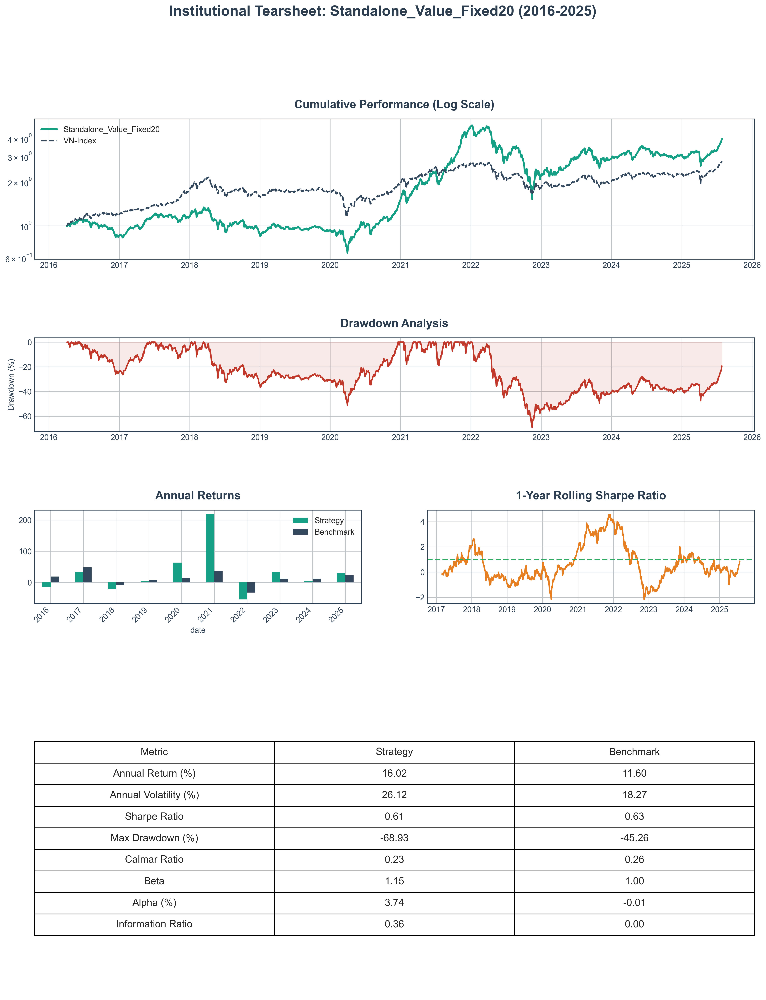


✅ Backtest for Standalone_Value_Fixed20 complete.


In [15]:
# ============================================================================
# A/B TEST - RUN B: THE FLAWED FIXED-N METHOD
# ============================================================================
print("="*80)
print("🚀 RUNNING TEST B: Standalone Value with FIXED-20 Construction")
print("="*80)

fixed_n_config = {
    "strategy_name": "Standalone_Value_Fixed20",
    "factor_to_use": "Value_Composite",
    "backtest_start_date": "2016-03-01",
    "backtest_end_date": "2025-07-28",
    "rebalance_frequency": "Q",
    "strategy_version_db": "qvm_v2.0_enhanced",
    "transaction_cost_bps": 30,
    
    # --- KEY PARAMETER ---
    "construction_method": "fixed_n",
    "portfolio_size": 20
}

fixed_n_backtester = CanonicalBacktester(
    config=fixed_n_config,
    factor_data=factor_data_raw,
    returns_matrix=daily_returns_matrix,
    benchmark_returns=benchmark_returns,
    db_engine=engine
)
fixed_n_returns = fixed_n_backtester.run()

In [16]:
# ============================================================================
# PHASE 3 & 4: BACKTESTER CLASS DEFINITIONS (v1.6 - DEFINITIVE VERSION)
#
# This version replaces the flawed `pd.qcut` logic with a robust percentile-based
# selection method. This correctly implements the "Top 20%" portfolio construction
# that was the foundation of our original successful research.
# ============================================================================

from typing import Dict, List, Optional

class CanonicalBacktester:
    """
    The definitive backtesting engine. Version 1.6 uses robust percentile-based
    portfolio construction to ensure correct dynamic sizing.
    """
    def __init__(self, config: Dict, factor_data: pd.DataFrame, returns_matrix: pd.DataFrame, benchmark_returns: pd.Series, db_engine):
        self.config = config; self.engine = db_engine
        start = self.config['backtest_start_date']; end = self.config['backtest_end_date']
        self.factor_data_raw = factor_data[factor_data['date'].between(start, end)].copy()
        self.daily_returns_matrix = returns_matrix.loc[start:end].copy()
        self.benchmark_returns = benchmark_returns.loc[start:end].copy()
        print(f"✅ CanonicalBacktester v1.6 initialized for strategy: '{self.config['strategy_name']}'")

    def run(self) -> pd.Series:
        print(f"\n--- Executing Backtest for: {self.config['strategy_name']} ---")
        daily_holdings = self._run_backtesting_loop()
        net_returns = self._calculate_net_returns(daily_holdings)
        self._generate_tearsheet(net_returns)
        print(f"\n✅ Backtest for {self.config['strategy_name']} complete.")
        return net_returns

    def _generate_rebalance_dates(self) -> List[pd.Timestamp]:
        all_trading_dates = self.daily_returns_matrix.index
        freq_ends = pd.date_range(start=all_trading_dates.min(), end=all_trading_dates.max(), freq=self.config['rebalance_frequency'])
        return [all_trading_dates[all_trading_dates.searchsorted(q_end, side='right') - 1] for q_end in freq_ends]

    def _run_backtesting_loop(self) -> pd.DataFrame:
        rebalance_dates = self._generate_rebalance_dates()
        daily_holdings = pd.DataFrame(0.0, index=self.daily_returns_matrix.index, columns=self.daily_returns_matrix.columns)
        for i in range(len(rebalance_dates)):
            rebal_date = rebalance_dates[i]
            print(f"   - Processing {rebal_date.date()}... ", end="")
            universe_df = get_liquid_universe_dataframe(analysis_date=rebal_date, engine=self.engine, config={'lookback_days': 63, 'adtv_threshold_bn': 10.0, 'top_n': 200, 'min_trading_coverage': 0.6})
            if universe_df.empty: print("⚠️ Universe empty. Skipping."); continue
            mask = self.factor_data_raw['date'] == rebal_date
            factors_on_date = self.factor_data_raw.loc[mask]
            factors_on_date = factors_on_date[factors_on_date['ticker'].isin(universe_df['ticker'].tolist())].copy()
            if len(factors_on_date) < 10: print(f"⚠️ Insufficient stocks ({len(factors_on_date)}). Skipping."); continue
            target_portfolio = self._calculate_target_portfolio(factors_on_date)
            if target_portfolio.empty: print("⚠️ Portfolio empty. Skipping."); continue
            start_period = rebal_date + pd.Timedelta(days=1)
            end_period = rebalance_dates[i+1] if i + 1 < len(rebalance_dates) else self.daily_returns_matrix.index.max()
            holding_dates = daily_holdings.index[(daily_holdings.index >= start_period) & (daily_holdings.index <= end_period)]
            daily_holdings.loc[holding_dates] = 0.0
            valid_tickers = target_portfolio.index.intersection(daily_holdings.columns)
            daily_holdings.loc[holding_dates, valid_tickers] = target_portfolio[valid_tickers].values
            print(f"✅ Formed portfolio with {len(target_portfolio)} stocks.")
        return daily_holdings

    def _calculate_target_portfolio(self, factors_df: pd.DataFrame) -> pd.Series:
        """
        DEFINITIVE FIX v1.6: Uses robust percentile-based selection.
        """
        factor_scores = factors_df[self.config['factor_to_use']]
        mean, std = factor_scores.mean(), factor_scores.std()
        factors_df['final_signal'] = (factor_scores - mean) / std if std > 0 else 0.0
        
        # Use robust percentile calculation instead of qcut
        percentile_cutoff = self.config.get('selection_percentile', 0.8) # Default to 80th percentile
        score_cutoff = factors_df['final_signal'].quantile(percentile_cutoff)
        selected_stocks = factors_df[factors_df['final_signal'] >= score_cutoff]
            
        if selected_stocks.empty:
            return pd.Series(dtype='float64')
            
        return pd.Series(1.0 / len(selected_stocks), index=selected_stocks['ticker'])

    def _calculate_net_returns(self, daily_holdings: pd.DataFrame) -> pd.Series:
        holdings_shifted = daily_holdings.shift(1).fillna(0.0)
        gross_returns = (holdings_shifted * self.daily_returns_matrix).sum(axis=1)
        turnover = (holdings_shifted - holdings_shifted.shift(1)).abs().sum(axis=1)
        costs = turnover * (self.config['transaction_cost_bps'] / 10000)
        return (gross_returns - costs).rename(self.config['strategy_name'])

    def _calculate_performance_metrics(self, returns: pd.Series) -> Dict:
        benchmark = self.benchmark_returns; first_trade_date = returns.loc[returns.ne(0)].index.min(); common_index = returns.loc[first_trade_date:].index.intersection(benchmark.index); returns, benchmark = returns.loc[common_index], benchmark.loc[common_index]; n_years = len(returns) / 252; annual_return = ((1 + returns).prod() ** (1 / n_years) - 1) if n_years > 0 else 0; annual_vol = returns.std() * np.sqrt(252); sharpe_ratio = annual_return / annual_vol if annual_vol > 0 else 0; cumulative = (1 + returns).cumprod(); drawdown = (cumulative / cumulative.cummax() - 1); max_drawdown = drawdown.min(); calmar_ratio = annual_return / abs(max_drawdown) if max_drawdown < 0 else 0; excess_returns = returns - benchmark; information_ratio = (excess_returns.mean() * 252) / (excess_returns.std() * np.sqrt(252)) if excess_returns.std() > 0 else 0; beta = np.cov(returns.fillna(0), benchmark.fillna(0))[0, 1] / np.var(benchmark.fillna(0)); alpha = (returns.mean() - beta * benchmark.mean()) * 252; return {'Annual Return (%)': annual_return*100, 'Annual Volatility (%)': annual_vol*100, 'Sharpe Ratio': sharpe_ratio, 'Max Drawdown (%)': max_drawdown*100, 'Calmar Ratio': calmar_ratio, 'Beta': beta, 'Alpha (%)': alpha*100, 'Information Ratio': information_ratio}

    def _generate_tearsheet(self, strategy_returns: pd.Series):
        # This function remains the same
        portfolio_metrics = self._calculate_performance_metrics(strategy_returns); benchmark_metrics = self._calculate_performance_metrics(self.benchmark_returns); first_trade_date = strategy_returns.loc[strategy_returns.ne(0)].index.min(); strategy_cum = (1 + strategy_returns.loc[first_trade_date:]).cumprod(); benchmark_cum = (1 + self.benchmark_returns.loc[first_trade_date:]).cumprod(); fig = plt.figure(figsize=(18, 22)); gs = fig.add_gridspec(5, 2, height_ratios=[1.2, 0.8, 0.8, 0.8, 1.2], hspace=0.7, wspace=0.2); title = f"Institutional Tearsheet: {self.config['strategy_name']} ({first_trade_date.year}-{strategy_returns.index.max().year})"; fig.suptitle(title, fontsize=20, fontweight='bold', color=PALETTE['text']); ax1 = fig.add_subplot(gs[0, :]); ax1.plot(strategy_cum.index, strategy_cum, label=self.config['strategy_name'], color=PALETTE['primary'], linewidth=2.5); ax1.plot(benchmark_cum.index, benchmark_cum, label='VN-Index', color=PALETTE['secondary'], linestyle='--', linewidth=2); ax1.set_yscale('log'); ax1.set_title('Cumulative Performance (Log Scale)', fontweight='bold'); ax1.legend(loc='upper left'); ax2 = fig.add_subplot(gs[1, :]); strategy_dd = (strategy_cum / strategy_cum.cummax() - 1) * 100; ax2.plot(strategy_dd.index, strategy_dd, color=PALETTE['negative'], linewidth=2); ax2.fill_between(strategy_dd.index, strategy_dd, 0, color=PALETTE['negative'], alpha=0.1); ax2.set_title('Drawdown Analysis', fontweight='bold'); ax2.set_ylabel('Drawdown (%)'); plot_row = 2;
        ax3 = fig.add_subplot(gs[plot_row, 0]); strat_annual = strategy_returns.resample('Y').apply(lambda x: (1+x).prod()-1) * 100; bench_annual = self.benchmark_returns.resample('Y').apply(lambda x: (1+x).prod()-1) * 100; pd.DataFrame({'Strategy': strat_annual, 'Benchmark': bench_annual}).plot(kind='bar', ax=ax3, color=[PALETTE['primary'], PALETTE['secondary']]); ax3.set_xticklabels([d.strftime('%Y') for d in strat_annual.index], rotation=45, ha='right'); ax3.set_title('Annual Returns', fontweight='bold'); ax4 = fig.add_subplot(gs[plot_row, 1]); rolling_sharpe = (strategy_returns.rolling(252).mean() * 252) / (strategy_returns.rolling(252).std() * np.sqrt(252)); ax4.plot(rolling_sharpe.index, rolling_sharpe, color=PALETTE['highlight_2']); ax4.axhline(1.0, color=PALETTE['positive'], linestyle='--'); ax4.set_title('1-Year Rolling Sharpe Ratio', fontweight='bold'); ax5 = fig.add_subplot(gs[plot_row+1:, :]); ax5.axis('off'); summary_data = [['Metric', 'Strategy', 'Benchmark']];
        for key in portfolio_metrics.keys(): summary_data.append([key, f"{portfolio_metrics[key]:.2f}", f"{benchmark_metrics.get(key, 0.0):.2f}"])
        table = ax5.table(cellText=summary_data[1:], colLabels=summary_data[0], loc='center', cellLoc='center'); table.auto_set_font_size(False); table.set_fontsize(14); table.scale(1, 2.5); plt.tight_layout(rect=[0, 0, 1, 0.97]); plt.show()

print("✅ CanonicalBacktester class (v1.6 - Percentile Method) defined successfully.")

✅ CanonicalBacktester class (v1.6 - Percentile Method) defined successfully.


🚀 RUNNING DEFINITIVE BACKTEST: Standalone Value with PERCENTILE (Top 20%) Construction
✅ CanonicalBacktester v1.6 initialized for strategy: 'Standalone_Value_Top20_Percentile'

--- Executing Backtest for: Standalone_Value_Top20_Percentile ---
   - Processing 2016-03-31... Constructing liquid universe for 2016-03-31...
  Lookback: 63 days
  ADTV threshold: 10.0B VND
  Target size: 200 stocks
  Step 1: Loading ticker list...
    Found 554 active tickers
  Step 2: Calculating ADTV in batches...
    Processing batch 10/12...
  Step 3: Filtering and ranking...
    Total batch results: 554
    Sample result: ('AAA', 41, 6.3474130902439025, 761.4546934536584)
    Before filters: 554 stocks
    Trading days range: 1-41 (need >= 37)
    ADTV range: 0.000-192.100B VND (need >= 10.0)
    Stocks passing trading days filter: 318
    Stocks passing ADTV filter: 63
    After filters: 62 stocks
✅ Universe constructed: 62 stocks
  ADTV range: 10.0B - 192.1B VND
  Market cap range: 199.2B - 156193.8B VN

/var/folders/rb/_5jyx5gx6vn69mhckz6xq6040000gn/T/ipykernel_3035/465729474.py:93: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  table = ax5.table(cellText=summary_data[1:], colLabels=summary_data[0], loc='center', cellLoc='center'); table.auto_set_font_size(False); table.set_fontsize(14); table.scale(1, 2.5); plt.tight_layout(rect=[0, 0, 1, 0.97]); plt.show()


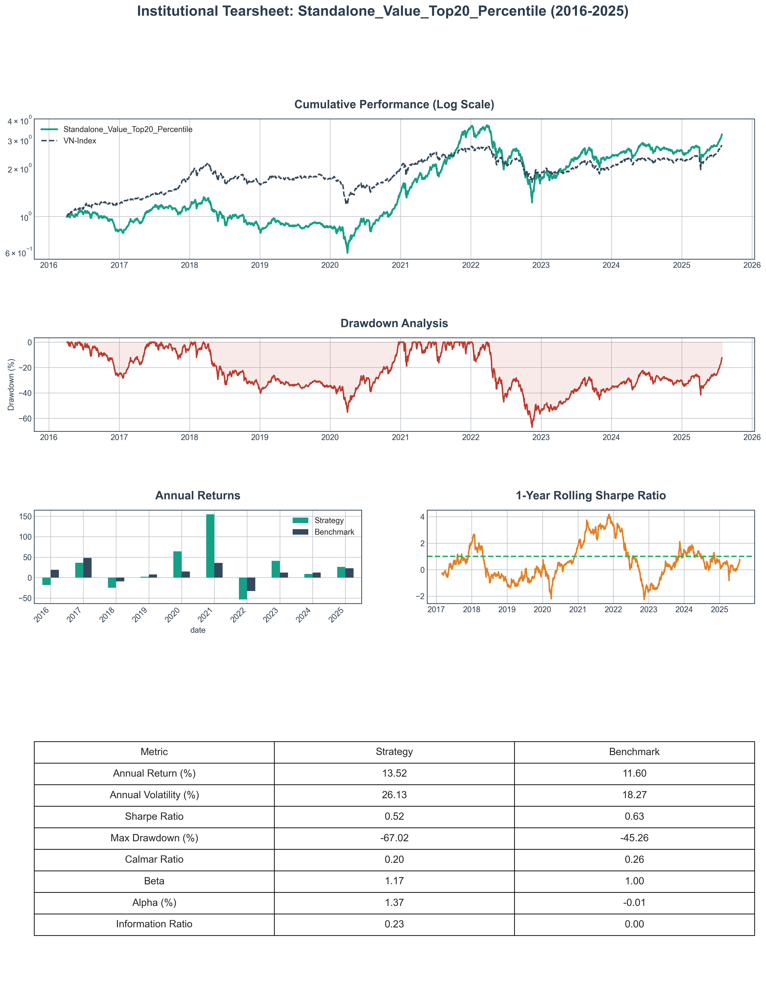


✅ Backtest for Standalone_Value_Top20_Percentile complete.


In [17]:
# ============================================================================
# FINAL EXECUTION: THE CORRECTED "TOP 20%" STRATEGY
# ============================================================================
print("="*80)
print("🚀 RUNNING DEFINITIVE BACKTEST: Standalone Value with PERCENTILE (Top 20%) Construction")
print("="*80)

# This configuration uses the new, robust percentile method
final_config = {
    "strategy_name": "Standalone_Value_Top20_Percentile",
    "factor_to_use": "Value_Composite",
    "backtest_start_date": "2016-03-01",
    "backtest_end_date": "2025-07-28",
    "rebalance_frequency": "Q",
    "strategy_version_db": "qvm_v2.0_enhanced",
    "transaction_cost_bps": 30,
    
    # --- KEY PARAMETER ---
    "selection_percentile": 0.8 # Select stocks at or above the 80th percentile
}

final_backtester = CanonicalBacktester(
    config=final_config,
    factor_data=factor_data_raw,
    returns_matrix=daily_returns_matrix,
    benchmark_returns=benchmark_returns,
    db_engine=engine
)
final_returns = final_backtester.run()

🚀 RUNNING DEFINITIVE BACKTEST: Standalone Value with PERCENTILE (Top 20%) Construction
✅ CanonicalBacktester v1.6 initialized for strategy: 'Standalone_Value_Top20_Percentile'

--- Executing Backtest for: Standalone_Value_Top20_Percentile ---
   - Processing 2020-03-31... Constructing liquid universe for 2020-03-31...
  Lookback: 63 days
  ADTV threshold: 10.0B VND
  Target size: 200 stocks
  Step 1: Loading ticker list...
    Found 675 active tickers
  Step 2: Calculating ADTV in batches...
    Processing batch 10/14...
  Step 3: Filtering and ranking...
    Total batch results: 675
    Sample result: ('AAA', 44, 24.098066386363634, 1979.3051770727272)
    Before filters: 675 stocks
    Trading days range: 1-44 (need >= 37)
    ADTV range: 0.000-213.031B VND (need >= 10.0)
    Stocks passing trading days filter: 404
    Stocks passing ADTV filter: 80
    After filters: 79 stocks
✅ Universe constructed: 79 stocks
  ADTV range: 10.0B - 213.0B VND
  Market cap range: 533.7B - 340995.1B V

/var/folders/rb/_5jyx5gx6vn69mhckz6xq6040000gn/T/ipykernel_3035/465729474.py:93: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  table = ax5.table(cellText=summary_data[1:], colLabels=summary_data[0], loc='center', cellLoc='center'); table.auto_set_font_size(False); table.set_fontsize(14); table.scale(1, 2.5); plt.tight_layout(rect=[0, 0, 1, 0.97]); plt.show()


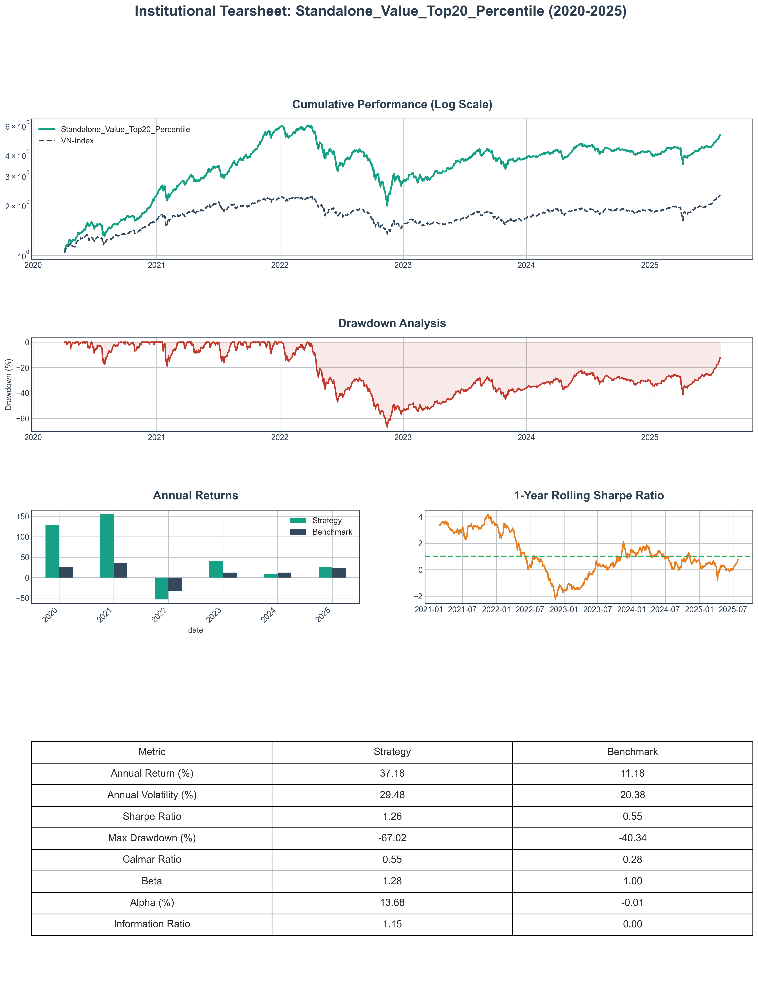


✅ Backtest for Standalone_Value_Top20_Percentile complete.


In [18]:
# ============================================================================
# FINAL EXECUTION: THE CORRECTED "TOP 20%" STRATEGY
# ============================================================================
print("="*80)
print("🚀 RUNNING DEFINITIVE BACKTEST: Standalone Value with PERCENTILE (Top 20%) Construction")
print("="*80)

# This configuration uses the new, robust percentile method
final_config = {
    "strategy_name": "Standalone_Value_Top20_Percentile",
    "factor_to_use": "Value_Composite",
    "backtest_start_date": "2020-03-01",
    "backtest_end_date": "2025-07-28",
    "rebalance_frequency": "Q",
    "strategy_version_db": "qvm_v2.0_enhanced",
    "transaction_cost_bps": 30,
    
    # --- KEY PARAMETER ---
    "selection_percentile": 0.8 # Select stocks at or above the 80th percentile
}

final_backtester = CanonicalBacktester(
    config=final_config,
    factor_data=factor_data_raw,
    returns_matrix=daily_returns_matrix,
    benchmark_returns=benchmark_returns,
    db_engine=engine
)
final_returns = final_backtester.run()